In [36]:
import json
import os
import sys

root_dir = os.path.abspath(os.path.join(os.path.dirname(os.getcwd()), '.'))
sys.path.append(root_dir)

from constants import *

import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']
rcParams['text.usetex'] = False 

colors = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#C2C2F0','#FFA07A', '#B0E0E6', '#FFD700', '#D3D3D3']
patterns = ['/', 'x', 'o', 
            '\\', '+', '.', 
            '|', '-', '*']

colors = ['#34568B',  # Royal Blue
          '#FFD700',  # Gold
          '#88CCEE',  # Light Blue
          '#DDDDDD',  # Light Gray
          '#555555',  # Dark Gray
          '#FF7F00',  # Mango Orange
          '#8B4513',  # Saddle Brown
          '#2CA02C',  # Lime Green (soft enough for color blindness)
          '#AA4499']  # Soft Purple

patterns = [None, '/', 'o', None, '\\', '.', None, '-', '*']

folder= "../../../../../应用/Overleaf/" + "Benchmarking RL Spatial Index"

label_size = 24
legend_size = 20
width_total = 0.7
spacing = 0.00
fig_width = 13.5
fig_height = 4

In [37]:
class TreeProperties:
    def __init__(self, **kwargs):
        
        self.Dimension = kwargs.get('Dimension', 0)
        self.FillFactor = kwargs.get('Fill factor', 0)
        self.IndexCapacity = kwargs.get('Index capacity', 0)
        self.LeafCapacity = kwargs.get('Leaf capacity', 0)
        self.TightMbrs = kwargs.get('Tight MBRs', 0)
        self.NearMinimumOverlapFactor = kwargs.get('Near minimum overlap factor', 0)
        self.ReinsertFactor = kwargs.get('Reinsert factor', 0)
        self.SplitDistributionFactor = kwargs.get('Split distribution factor', 0)
        self.Utilization = kwargs.get('Utilization', 0)
        self.Reads = kwargs.get('Reads', 0)
        self.Writes = kwargs.get('Writes', 0)
        self.Hits = kwargs.get('Hits', 0)
        self.Misses = kwargs.get('Misses', 0)
        self.TreeHeight = kwargs.get('Tree height', 0)
        self.NumberOfData = kwargs.get('Number of data', 0)
        self.NumberOfNodes = kwargs.get('Number of nodes', 0)
        self.Splits = kwargs.get('Splits', 0)
        self.Adjustments = kwargs.get('Adjustments', 0)
        self.QueryResults = kwargs.get('Query results', 0)
        self.BufferHits = kwargs.get('Buffer hits', 0)
        self.IndexId = kwargs.get('IndexId', 0)
        self.Status = kwargs.get('Status', 0)
        self.ElapsedTime = kwargs.get('Elapsed Time', 0)
        self.ElapsedBuildTime = kwargs.get('Elapsed Build Time', 0)
        self.ElapsedLearnTime = kwargs.get('Elapsed Learn Time', 0)
        if not self.ElapsedTime:
            # if self.ElapsedBuildTime and self.ElapsedLearnTime:
            self.ElapsedTime = self.ElapsedBuildTime + self.ElapsedLearnTime

        self.KnnQuery = kwargs.get('knn query', 0)
        self.IndexedSpace = kwargs.get('Indexed space', 0)
        self.Operations = kwargs.get('Operations', 0)
        self.IndexIo = kwargs.get('Index I/O', 0)
        self.LeafIo = kwargs.get('Leaf I/O', 0)
        
        self.QueryNum = kwargs.get('Query num', 1000)
        self.QueryMean = kwargs.get('Query mean', 0)
        self.QueryVariance = kwargs.get('Query variance', 0)
        self.QueryStdDev = kwargs.get('Query stdDev', 0)
        self.QueryP50 = kwargs.get('Query p50', 0)
        self.QueryP99 = kwargs.get('Query p99', 0)

        self.InsertNum = kwargs.get('Insert num', 0)
        self.InsertMean = kwargs.get('Insert mean', 0)
        self.InsertVariance = kwargs.get('Insert variance', 0)
        self.InsertStdDev = kwargs.get('Insert stdDev', 0)
        self.InsertP50 = kwargs.get('Insert p50', 0)
        self.InsertP99 = kwargs.get('Insert p99', 0)

        self.TreeDatSize = kwargs.get('Tree.dat Size', 0)
        self.TreeIdxSize = kwargs.get('Tree.idx Size', 0)

    def __str__(self):
        attrs = vars(self)
        return '\n'.join(f"{key}: {value}" for key, value in attrs.items())

In [3]:
def parse_rtree_properties(file_path):
    properties = {}
    
    if not os.path.exists(file_path):
        return TreeProperties(**properties)
    
    with open(file_path, 'r') as file:
        for line in file:
            if ": " in line: 
                key, value = line.strip().split(": ", 1)
                
                if value.isdigit():
                    value = int(value)
                elif value.replace('.', '', 1).isdigit():
                    value = float(value)
                properties[key] = value
    return TreeProperties(**properties)

In [4]:
def plot_hist(datasets, baseline_names, result, y_label="", is_legend=True, is_log=False, title="", output_file_paths=None, bottom=1, top=None):

    
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    width = width_total / len(baseline_names)
    x = np.arange(len(datasets))

    # plt.minorticks_on()
    ax.minorticks_on() # Enable minor ticks only on the y-axis

    
    group_width = len(baseline_names) * width 
    
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x - int(len(baseline_names) / 2) * width + i * width + offset
        ax.bar(adjusted_x, result[i], width=width, label=baseline, color=colors[i % len(colors)], hatch=patterns[i % len(patterns)], edgecolor='black', linestyle='--')

    # if not is_log:
    #     bottom = 0
    ax.set_ylim(bottom=bottom)
    if top:
        ax.set_ylim(top=top)
    ax.set_ylabel(y_label, fontsize=label_size)
    ax.set_xticks(x + spacing * (len(baseline_names) // 3 - 1) / 2) 
    ax.set_xticklabels(datasets, fontsize=label_size)
    ax.tick_params(axis='x', labelsize=label_size)
    ax.tick_params(axis='y', labelsize=label_size)

    ax.set_title(title, fontsize=label_size)
    
    if is_log:
        ax.set_yscale('log')
    
    if is_legend:
        legend = ax.legend(
            loc='upper center',
            bbox_to_anchor=(1.11, 1.05),
            fontsize=legend_size,
            ncol=1,
            borderaxespad=0.5,  # Border padding
            handletextpad=0.5,  # Padding between legend marker and text
            labelspacing=0.3    # Vertical space between legend entries
        )
        plt.setp(legend.get_title(), fontsize=legend_size)
        
    plt.tight_layout()
    
    if output_file_paths:
        for output_file_path in output_file_paths:
            if output_file_path.endswith(".pdf"):
                plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
            if output_file_path.endswith(".png"):
                plt.savefig(output_file_path, format='png', bbox_inches='tight')
    
    plt.show()
    plt.close(fig)

In [5]:
def plot_hist_stack(datasets, baseline_names, result, y_label=None, is_log=False, title="", output_file_paths=None, bottom=1, top=None, legend_labels=[], legend_location="left"):
    
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    width = width_total / len(baseline_names)
    x = np.arange(len(datasets))
    
    group_width = len(baseline_names) * width 
    bars = []
    
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x - int(len(baseline_names) / 2) * width + i * width + offset
        # ax.bar(adjusted_x, result[i], width=width, label=baseline, color=colors[i % len(colors)], hatch=patterns[i % len(patterns)])

        # bar1 = ax.bar(adjusted_x, [res[0] for res in result[i]], width=width, color=colors[i % len(colors)], hatch=patterns[i % len(patterns)], alpha=0.5, edgecolor='black', linestyle='--')
        bar1 = ax.bar(adjusted_x, [res[0] for res in result[i]], width=width, color=colors[i % len(colors)], hatch=patterns[4], alpha=1.0, edgecolor='black', linestyle='-.')

        bar2 = ax.bar(adjusted_x, [res[1] for res in result[i]], width=width, bottom=[res[0] for res in result[i]], color=colors[i % len(colors)], hatch=patterns[5], edgecolor='black', linestyle='-')
        bars.append(bar2)  

    ax.set_ylim(bottom=bottom)
    if top:
        ax.set_ylim(top=top)
    if y_label:
        ax.set_ylabel(y_label, fontsize=label_size)
    ax.set_xticks(x + spacing * (len(baseline_names) // 3 - 1) / 2) 
    ax.set_xticklabels(datasets, fontsize=label_size)
    ax.tick_params(axis='x', labelsize=label_size)
    ax.tick_params(axis='y', labelsize=label_size)
    ax.set_title(title, fontsize=label_size)
    
    if is_log:
        ax.set_yscale('log')
    
    # legend = ax.legend([bar[0] for bar in bars], loc='upper center', bbox_to_anchor=(1.1, 1), fontsize=legend_size, ncol=1)
    
    from matplotlib.patches import Patch
    io_legend_elements = [Patch(facecolor="white", alpha=1.0, edgecolor='black', hatch=patterns[4], linestyle='-', label=legend_labels[0]),
                          Patch(facecolor="white", alpha=1.0, edgecolor='black', hatch=patterns[5], linestyle='-.', label=legend_labels[1])]
    # IO_legend = ax.legend(handles=io_legend_elements, loc='upper left', bbox_to_anchor=(0.1, 1), fontsize=legend_size, title="I/O Type")
    IO_legend = ax.legend(handles=io_legend_elements, loc='upper left', bbox_to_anchor=(0.01, 1), fontsize=legend_size, ncol=2, frameon=False)
    if legend_location == "right":
        IO_legend = ax.legend(handles=io_legend_elements, loc='upper right', bbox_to_anchor=(1.01, 1), fontsize=legend_size, ncol=2, frameon=False)
        
    ax.add_artist(IO_legend)

    # legend = ax.legend([bar[0] for bar in bars], baseline_names, loc='upper center', bbox_to_anchor=(1.1, 1), fontsize=legend_size, ncol=1)
    # ax.add_artist(legend)
    
    bar_legend_elements = [Patch(facecolor=colors[i % len(colors)], alpha=1.0, label=baseline_names[i]) for i in range(len(baseline_names))]
    legend = ax.legend(
        # [bar[0] for bar in bars],
        bar_legend_elements,
        baseline_names,
        loc='upper center',
        bbox_to_anchor=(1.11, 1.05),
        fontsize=legend_size,
        ncol=1,
        borderaxespad=0.5,  # Border padding
        handletextpad=0.5,  # Padding between legend marker and text
        labelspacing=0.3    # Vertical space between legend entries
    )
    
    plt.setp(legend.get_title(), fontsize=legend_size)
    
    plt.tight_layout()
    
    if output_file_paths:
        for output_file_path in output_file_paths:
            if output_file_path.endswith(".pdf"):
                plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
            if output_file_path.endswith(".png"):
                plt.savefig(output_file_path, format='png', bbox_inches='tight')

    
    plt.show()
    plt.close(fig)

In [6]:
import matplotlib.pyplot as plt
import numpy as np

def plot_hist_stack_mirrored(datasets, baseline_names, result, y_label="", is_log=False, title="", output_file_paths=None, bottom1=None, top1=None, bottom2=None, top2=None,legend_labels=[], legend_location="left"):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(fig_width, fig_height), sharex=True, gridspec_kw={'height_ratios': [1, 1], 'hspace': 0})
    
    width = width_total / len(baseline_names)
    x = np.arange(len(datasets))
    group_width = len(baseline_names) * width 
    bars = []

    plt.minorticks_on()
    ax1.minorticks_on()
    ax2.minorticks_on()
    
    # Top plot (ax1)
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x - int(len(baseline_names) / 2) * width + i * width + offset
        bar1 = ax1.bar(adjusted_x, [res[0] for res in result[i]], width=width, color=colors[i % len(colors)], hatch=patterns[4], alpha=1.0, edgecolor='black', linestyle='-.')
        # bar2 = ax1.bar(adjusted_x, [res[1] for res in result[i]], width=width, bottom=[res[0] for res in result[i]], color=colors[i % len(colors)], hatch=patterns[5], edgecolor='black', linestyle='-')
        # bars.append(bar2)  

    ax1.set_ylabel(legend_labels[0], fontsize=label_size)
    ax1.set_title(title, fontsize=label_size)
    ax1.tick_params(axis='x', labelsize=label_size)
    ax1.tick_params(axis='y', labelsize=label_size)
    if bottom1:
        ax1.set_ylim(bottom=bottom1)
    if top1:
        ax1.set_ylim(top=top1)
    

    # Bottom plot (ax2) with inverted y-axis
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x - int(len(baseline_names) / 2) * width + i * width + offset
        # bar1 = ax2.bar(adjusted_x, [res[0] for res in result[i]], width=width, color=colors[i % len(colors)], hatch=patterns[4], alpha=1.0, edgecolor='black', linestyle='-.')
        bar2 = ax2.bar(adjusted_x, [res[1] for res in result[i]], width=width, color=colors[i % len(colors)], hatch=patterns[5], edgecolor='black', linestyle='-')
        # bars.append(bar2)  

    ax2.invert_yaxis()  # Invert the y-axis for the mirrored effect
    if bottom2:
        ax2.set_ylim(bottom=top2)
    if top2:
        ax2.set_ylim(top=bottom2)
    # ax2.set_ylim(bottom2, top2)
    ax2.set_ylabel(legend_labels[1], fontsize=label_size)
    ax2.set_xlabel("Datasets", fontsize=label_size)
    ax2.tick_params(axis='x', labelsize=label_size)
    ax2.tick_params(axis='y', labelsize=label_size)
    ax2.set_xticks(x)
    ax2.set_xticklabels(datasets, fontsize=label_size)

    if is_log:
        ax1.set_yscale('log')
        ax2.set_yscale('log')

    from matplotlib.patches import Patch
    io_legend_elements = [Patch(facecolor="white", alpha=1.0, edgecolor='black', hatch=patterns[4], linestyle='-', label=legend_labels[0]),
                          Patch(facecolor="white", alpha=1.0, edgecolor='black', hatch=patterns[5], linestyle='-.', label=legend_labels[1])]
    IO_legend = ax1.legend(handles=io_legend_elements, loc='upper left', bbox_to_anchor=(0.01, 1), fontsize=legend_size, ncol=2, frameon=False)
    if legend_location == "right":
        IO_legend = ax1.legend(handles=io_legend_elements, loc='upper right', bbox_to_anchor=(1.01, 1), fontsize=legend_size, ncol=2, frameon=False)
        
    ax1.add_artist(IO_legend)
    
    bar_legend_elements = [Patch(facecolor=colors[i % len(colors)], alpha=1.0, label=baseline_names[i]) for i in range(len(baseline_names))]
    legend = ax1.legend(
        bar_legend_elements,
        baseline_names,
        loc='upper center',
        bbox_to_anchor=(1.11, 1.05),
        fontsize=legend_size,
        ncol=1,
        borderaxespad=0.5,  # Border padding
        handletextpad=0.5,  # Padding between legend marker and text
        labelspacing=0.3    # Vertical space between legend entries
    )
    
    plt.setp(legend.get_title(), fontsize=legend_size)
    
    plt.tight_layout()
    
    if output_file_paths:
        for output_file_path in output_file_paths:
            if output_file_path.endswith(".pdf"):
                plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
            if output_file_path.endswith(".png"):
                plt.savefig(output_file_path, format='png', bbox_inches='tight')

    plt.show()
    plt.close(fig)


In [7]:
def plot_line(datasets, baseline_names, result, x_label="", y_label="", is_log=False, title="", output_file_paths=None, bottom=None, top=None):
    label_size = 24
    legend_size = 20
    
    fig, ax = plt.subplots(figsize=(12, 4))
    x = np.arange(len(datasets))
    
    spacing = 0.02

    markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'x', '+']
    linestyles = ['-', '--', '-.']
    combinations = [(m, ls) for m in markers for ls in linestyles]
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x + offset
        ax.plot(adjusted_x, result[i], label=baseline, marker=markers[i], linestyle=linestyles[i%len(linestyles)], color=colors[i % len(colors)], markersize=10)

    # colors = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#C2C2F0','#FFA07A', '#B0E0E6', '#FFD700', '#D3D3D3']

    if bottom:
        ax.set_ylim(bottom=bottom)
    if top:
        ax.set_ylim(top=top)
    ax.set_ylabel(y_label, fontsize=label_size)
    ax.set_xlabel(x_label, fontsize=label_size)
    ax.set_xticks(x + spacing * (len(baseline_names) // 3 - 1) / 2)
    ax.set_xticklabels(datasets, fontsize=label_size)
    ax.tick_params(axis='x', labelsize=label_size)
    ax.tick_params(axis='y', labelsize=label_size)

    ax.set_title(title, fontsize=label_size)
    
    if is_log:
        ax.set_yscale('log')
    
    # legend = ax.legend(loc='upper center', bbox_to_anchor=(1.1, 1), fontsize=legend_size, ncol=1)
    
    legend = ax.legend(
        loc='upper center',
        bbox_to_anchor=(1.12, 1.05),
        fontsize=legend_size,
        ncol=1,
        borderaxespad=0.5,  # Border padding
        handletextpad=0.5,  # Padding between legend marker and text
        labelspacing=0.3    # Vertical space between legend entries
    )
    
    plt.setp(legend.get_title(), fontsize=legend_size)
    
    plt.tight_layout()
    
    if output_file_paths:
        for output_file_path in output_file_paths:
            if output_file_path.endswith(".pdf"):
                plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
            if output_file_path.endswith(".png"):
                plt.savefig(output_file_path, format='png', bbox_inches='tight')
    
    plt.show()
    plt.close(fig)

### Parameters

In [38]:
# baselines = ['bmtree', 'kdtree', 'ketree_greddy', 'qdtree', 'r_star_tree', 'rankspace_zorder', 'rlrtree', 'rtree', 'zorder']
build_result_path = "../result/libspatialindex/HDD/4K/{name}/build/"
point_result_path = "../result/libspatialindex/HDD/4K/{name}/point/"
range_result_path = "../result/libspatialindex/HDD/4K/{name}/range/"
knn_result_path = "../result/libspatialindex/HDD/4K/{name}/knn/"
insert_result_path = "../result/libspatialindex/HDD/4K/{name}/insert/"
insert_point_result_path = "../result/libspatialindex/HDD/4K/{name}/insert_point/"

baseline_suffix = {'bmtree':'_bits_32_depth_10_sample_10000', 
                   'kdtree':'',
                   'kdtree_greedy':'',
                   'qdtree':'_episode_10_sampling_ratio_0.0001_action_space_200',
                   'r_star_tree':'_rstar',
                   'rankspace_zorder':'_bits_32',
                   'rlrtree':'_rlrtree_epoch_10_sample_10000',
                   'rtree':'_quadratic',
                   'zorder':'_bits_32'}


In [39]:
data_names = ["us_100000000", "india_100000000", "australia_100000000", "data_100000000_2_uniform_1", "data_100000000_2_normal_1", "data_100000000_2_skewed_4"]
data_names_write = ["us_10000000", "india_10000000", "australia_10000000", "data_10000000_2_uniform_1", "data_10000000_2_normal_1", "data_10000000_2_skewed_4"]
display_data_names = ["US", "INDIA", "AUS", "UNI", "NORM",  "SKEW"]
real_default_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_default_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
build_result_name_pattern = "{data_name}{default_range_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']
baselines = ['rtree', 'r_star_tree',  'kdtree', 'kdtree_greedy','zorder', 'rankspace_zorder']
baselines = ['rtree', 'r_star_tree', 'rlrtree', 'kdtree', 'kdtree_greedy', 'qdtree', 'zorder', 'rankspace_zorder', 'bmtree']
display_baselines = ['RT', 'RST', 'KD', 'KDG','ZR', 'ZRR']
display_baselines = ['RT', 'RST', 'RLR', 'KD', 'KDG', 'QD','ZR', 'ZRR', 'BMT']
display_baselines = ['R-tree', 'R*-tree', 'RLR-tree', 'Kd-tree', 'GKd-tree', 'Qd-tree','ZR-tree', 'ZRR-tree', 'BM-tree']


### Read Only

#### Build

rtree [6.497601, 6.365928, 6.171355, 7.753694, 7.783847, 7.447848]
r_star_tree [55.307861, 55.774834, 55.391053, 56.79747, 57.400995, 58.987488]
rlrtree [7.337752, 7.074834, 6.993776, 8.812799, 8.425529, 8.873376]
kdtree [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
kdtree_greedy [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
qdtree [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
zorder [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
rankspace_zorder [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
bmtree [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[[15, 63], [4, 46], [5, 47], [13, 45], [13, 45], [13, 45]]
[[4, 30], [0, 30], [0, 31], [0, 28], [0, 28], [0, 27]]
[[204, 3], [199, 3], [198, 3], [199, 3], [207, 3], [190, 3]]
[[5, 5, 5, 5, 5, 5], [5, 5, 5, 5, 5, 5], [5, 5, 5, 5, 5, 5], [21, 21, 21, 21, 21, 21], [41, 42, 41, 42, 39, 38], [21, 21, 21, 21, 21, 21], [4, 4, 4, 4, 4, 4], [4, 4, 4, 4, 4, 4], [4, 4, 4, 4, 4, 4]]


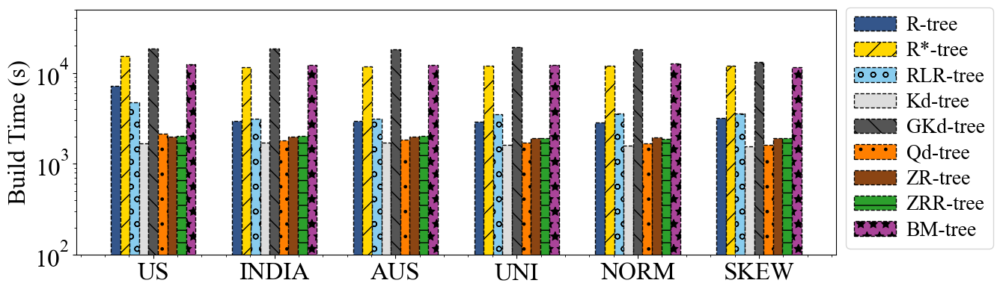

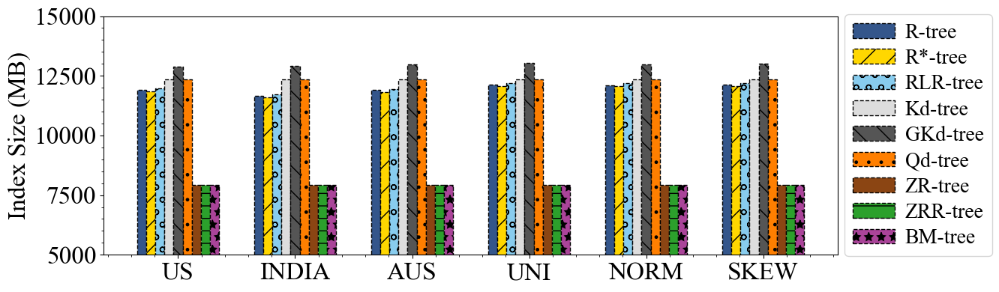

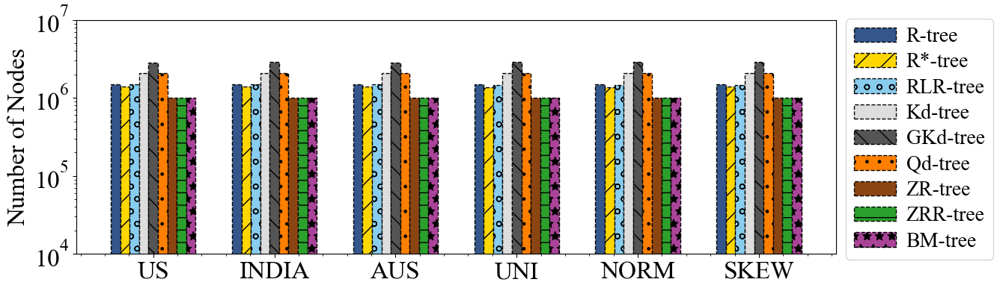

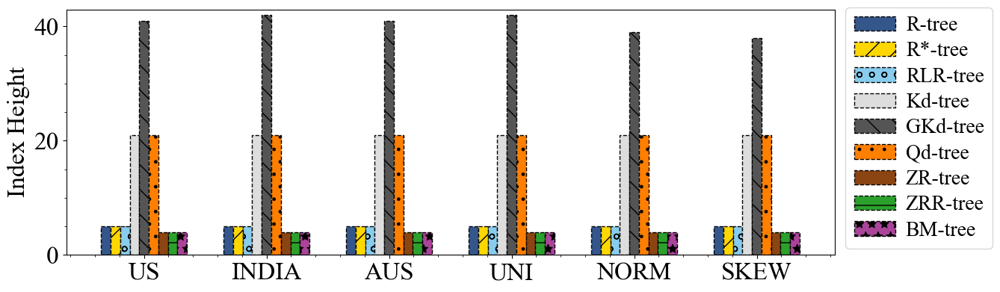

In [10]:
result = []
utilization_result = []
splits_result = []
adjustments_result = []
index_size = []
node_number = []
tree_height = []
build = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_utilization_results = []
    dataset_splits_results = []
    dataset_adjustments_results = []
    dataset_index_size = []
    dataset_node_number = []
    dataset_tree_height = []
    dataset_build = []
    
    for data_name in data_names:

        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            
        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(build_result_path.format(name=baseline), build_result_name)

        tree_property = parse_rtree_properties(res)
        
        # dataset_results.append({
        #     'ElapsedTime': tree_property.ElapsedTime,
        #     'ElapsedBuildTime': tree_property.ElapsedBuildTime,
        #     'ElapsedLearnTime': tree_property.ElapsedLearnTime
        # })

        dataset_build.append([int(tree_property.ElapsedLearnTime / 1e9 / 60) , int(tree_property.ElapsedBuildTime / 1e9 / 60)])
        # print(tree_property.ElapsedTime, tree_property.ElapsedLearnTime)
        dataset_results.append(float(tree_property.ElapsedTime / 1e9))
        dataset_utilization_results.append(tree_property.Utilization)
        dataset_splits_results.append(tree_property.Splits)
        dataset_adjustments_results.append(tree_property.Adjustments / 1e6)
        dataset_index_size.append((tree_property.TreeDatSize + tree_property.TreeIdxSize) / (1024 * 1024))
        dataset_node_number.append(tree_property.NumberOfNodes)
        dataset_tree_height.append(tree_property.TreeHeight)
        # print(baseline, data_name, tree_property.Utilization)

    result.append(dataset_results) 
    utilization_result.append(dataset_utilization_results) 
    splits_result.append(dataset_splits_results) 
    adjustments_result.append(dataset_adjustments_results) 
    print(baseline, dataset_adjustments_results)
    index_size.append(dataset_index_size)
    node_number.append(dataset_node_number)
    tree_height.append(dataset_tree_height)
    build.append(dataset_build)

# print(utilization_result)
# print(splits_result)
# print(adjustments_result)
# print(index_size)

print(build[2])
print(build[5])
print(build[8])
print(tree_height)

plot_hist(display_data_names, display_baselines, result, y_label="Build Time (s)", is_log=True,  output_file_paths=
          [folder + "/exp_sigmod/build.pdf", "../figs/exp_sigmod/build.png"],bottom=1e2, top=5e4)

# plot_hist_stack(display_data_names, display_baselines, build, y_label="Build Time (s)",  is_log=True, output_file_paths=
#           [folder + "/figs/build.pdf", "../figs/exp/build.png"], legend_labels=["Build", "Train"])

plot_hist(display_data_names, display_baselines, index_size, y_label="Index Size (MB)", is_log=False,  output_file_paths=
          [folder + "/exp_sigmod/index_size.pdf", "../figs/exp_sigmod/index_size.png"],bottom=5000, top=15000)

plot_hist(display_data_names, display_baselines, node_number, y_label="Number of Nodes", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/node_number.pdf", "../figs/exp_sigmod/node_number.png"],bottom=1e4, top=1e7)

plot_hist(display_data_names, display_baselines, tree_height, y_label="Index Height", is_log=False, output_file_paths=
          [folder + "/exp_sigmod/tree_height.pdf", "../figs/exp_sigmod/tree_height.png"],bottom=0, top=43)


#### Point Query

[[249.88655788499997, 212.942867815, 322.347343985, 103.585213655, 247.105405345, 267.30551004], [68.39498151500001, 66.468538965, 114.199640105, 47.886892875, 74.539880585, 73.04059709500001], [188.78810147, 169.31353351, 268.98843401000005, 99.15886001, 133.472546695, 260.98172052], [42.238080705, 55.447788085, 56.24276233, 49.551383705, 50.75359861, 50.409807345000004], [4405.646971625, 43.174920005, 42.874970155, 43.36658133, 43.80410899, 49.886760329999994], [3400.07872693, 125.8181881850001, 52.7519021, 56.990595605, 53.93382973, 65.829619905], [133.09802888, 126.884098175, 150.76369766500002, 133.89720405, 141.54935371, 128.147285375], [96.37185978, 98.756115055, 102.469226255, 77.770532235, 86.813771765, 76.63625651999999], [448.68725820500003, 564.01134224, 10108.32367192, 147.263108695, 139.66943503, 94.636641585]]


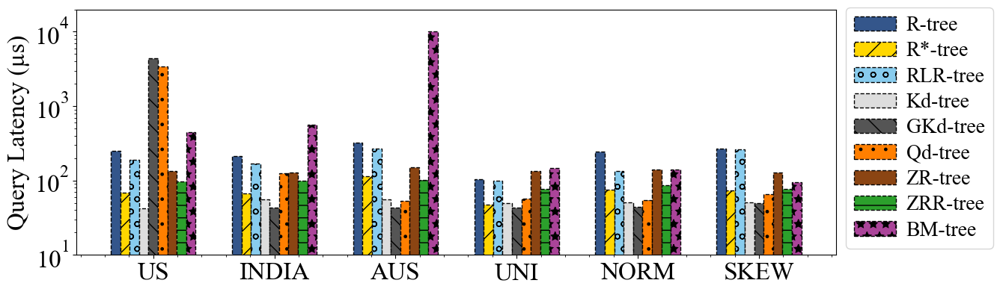

['US', 'INDIA', 'AUS', 'UNI', 'NORM', 'SKEW']


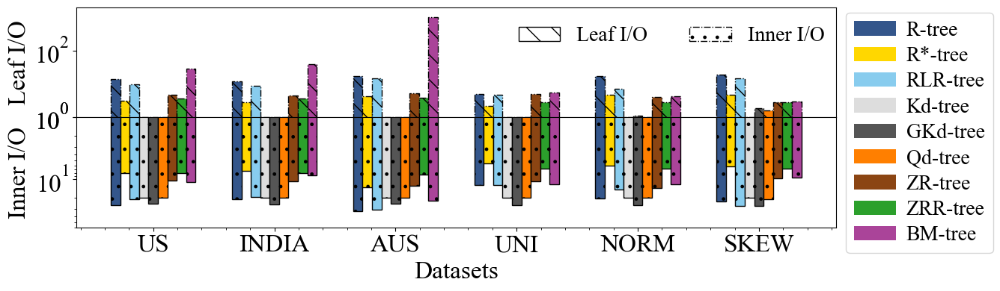

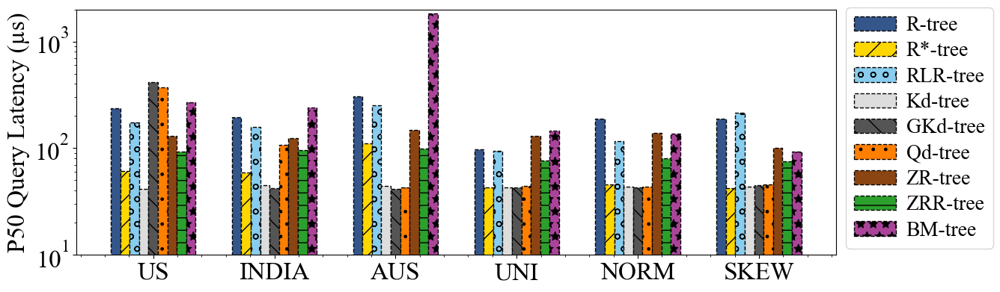

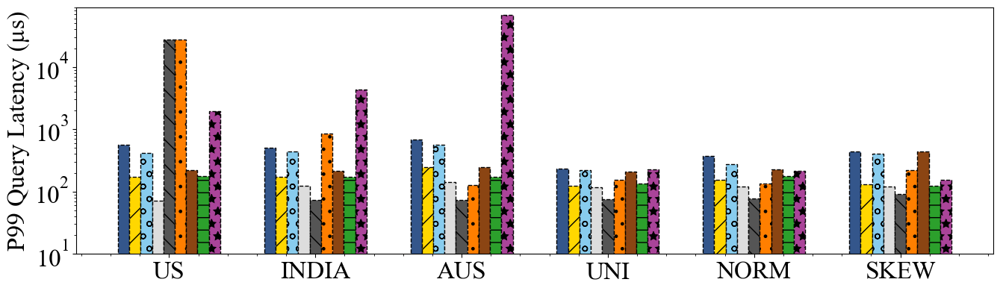

In [49]:
# 1 
# default_range_name = "_{data_name}_range_1000_2_normal_1_0.001x0.001"
real_point_name = "{data_name}_point_200000_2_uniform_1"
synthetic_point_name = "point_200000_{data_name}_2_uniform_1"
point_result_name_pattern = "{data_name}{default_range_name}_{point_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

result = []
query_result_num = []
IO = []
P99 = []
P50 = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for data_name in data_names:

        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
            point_name = synthetic_point_name.format(data_name=data_name)
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            point_name = real_point_name.format(data_name=data_name)
        
        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(point_result_path.format(name=baseline), point_result_name)
        
        tree_property = parse_rtree_properties(res)

        # self.QueryNum = kwargs.get('Query num', None)
        # self.QueryMean = kwargs.get('Query mean', None)
        # self.QueryVariance = kwargs.get('Query variance', None)
        # self.QueryStdDev = kwargs.get('Query stdDev', None)
        # self.QueryP50 = kwargs.get('Query p50', None)
        # self.QueryP99 = kwargs.get('Query p99', None)
 
        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # dataset_IO.append((tree_property.IndexIo + tree_property.LeafIo) / 200000)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)

    
    result.append(dataset_results) 
    query_result_num.append(dataset_result_num)
    IO.append(dataset_IO)
    P50.append(dataset_P50)
    P99.append(dataset_P99)

print(result)
# print(IO)

# print(query_result_num)
# plot_hist(display_data_names, display_baselines, query_result_num, y_label="Result Num", title="Point query result num", output_file_paths=
#           [folder + "/figs/point_result_num.pdf", "../figs/exp/point_result_num.png"])

plot_hist(display_data_names, display_baselines, result, y_label="Query Latency (µs)",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/point_query.pdf", "../figs/exp_sigmod/point_query.png"], bottom=1e1, top=2*1e4)

# plot_hist(display_data_names, display_baselines, IO, y_label="I/O", output_file_paths=
#           [folder + "/figs/point_IO.pdf", "../figs/exp/point_IO.png"])

# plot_hist_stack(display_data_names, display_baselines, IO, y_label="I/O",  is_log=False, output_file_paths=
#           [folder + "/figs/point_IO.pdf", "../figs/exp/point_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
#                 bottom=50, top=70)

print(display_data_names)
plot_hist_stack_mirrored(display_data_names, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/point_IO.pdf", "../figs/exp_sigmod/point_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=2*1e3, bottom2=1, top2=60)

# title="P50 Latency for Point Query"
plot_hist(display_data_names, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True,  output_file_paths=
          [folder + "/exp_sigmod/point_query_P50.pdf", "../figs/exp_sigmod/point_query_P50.png"], bottom=1e1, top=2*1e3)

plot_hist(display_data_names, display_baselines, P99, y_label="P99 Query Latency (µs)",is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/point_query_P99.pdf", "../figs/exp_sigmod/point_query_P99.png"], bottom=1e1, top=9*1e4)

#### Range Query

[[5188.278387, 2760.972175, 17483.217160999997, 359.10841600000003, 352.142325, 268.971206], [4120.97589, 1863.649081, 15001.145514, 104.77865700000001, 88.07934900000001, 79.561035], [5200.55198, 2562.879224, 18535.020115, 254.10051, 357.735229, 1458.753849], [3126.354879, 2081.3035840000002, 13887.334767999999, 138.370889, 123.112132, 106.340825], [98965.805698, 2521.494789, 13366.103737, 183.841641, 167.633836, 187.200848], [106848.013476, 64020.266664999996, 17412.315682, 675.087284, 898.2986430000001, 728.918372], [3411.794592, 1661.198386, 11547.032484, 255.169813, 200.718158, 167.715677], [3408.028101, 1630.370435, 11491.453752, 145.871439, 231.442118, 142.335798], [4424.548853, 2648.456747, 28553.196321, 222.550274, 201.460606, 174.344882]]


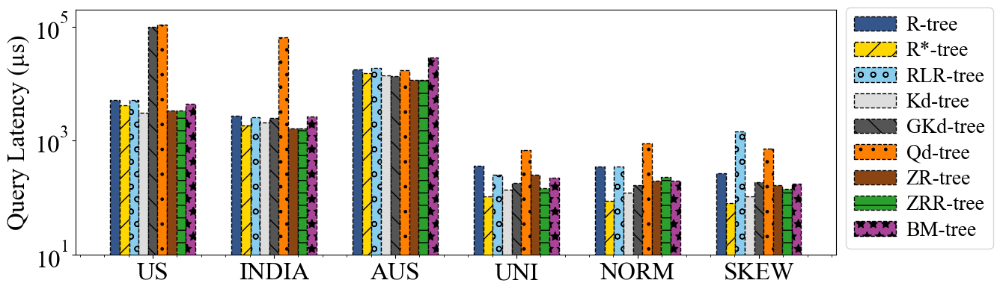

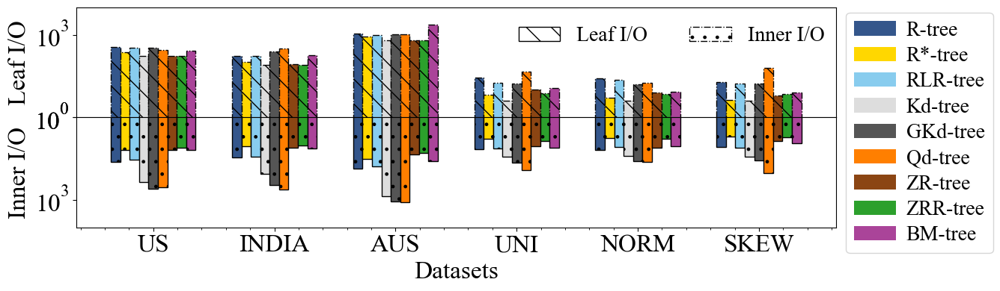

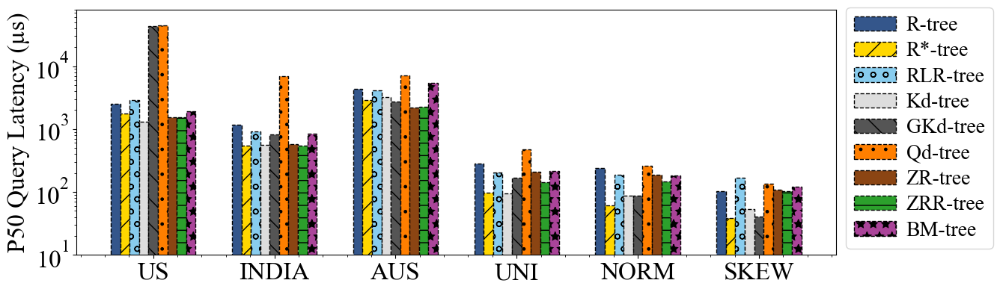

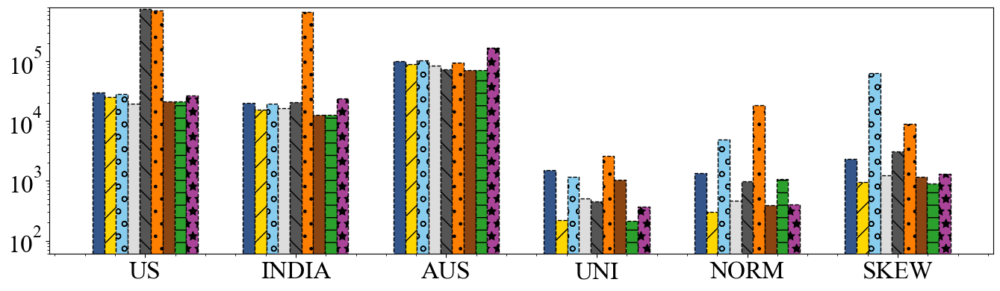

In [53]:
real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"
result = []
IO = []

P99 = []
P50 = []

query_result_num = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for data_name in data_names:

        if data_name.startswith("data"):
            range_name = synthetic_range_name_pattern
        else:
            range_name=real_range_name_pattern.format(data_name=data_name)
        
        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # dataset_IO.append((tree_property.IndexIo + tree_property.LeafIo)/1000)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        
    result.append(dataset_results) 
    query_result_num.append(dataset_result_num) 
    IO.append(dataset_IO)
    P50.append(dataset_P50)
    P99.append(dataset_P99)

# print(IO)
print(result)


# plot_hist(display_data_names, display_baselines, query_result_num, y_label="Result Num", output_file_paths=
#           [folder + "/figs/range_query_result_num.pdf", "../figs/exp/range_query_result_num.png"])

# plot_hist(data_names, baselines, result)
plot_hist(display_data_names, display_baselines, result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_time.pdf", "../figs/exp_sigmod/range_query_time.png"], bottom=1e1, top=2*1e5)

# plot_hist(display_data_names, display_baselines, IO, y_label="I/O", output_file_paths=
#           [folder + "/figs/range_query_IO.pdf", "../figs/exp/range_query_IO.png"])

# plot_hist_stack(display_data_names, display_baselines, IO, y_label="I/O", is_log=True, output_file_paths=
#           [folder + "/figs/range_query_IO.pdf", "../figs/exp/range_query_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"], legend_location="right")

plot_hist_stack_mirrored(display_data_names, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_IO.pdf", "../figs/exp_sigmod/range_query_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=10000, bottom2=1, top2=10000)

plot_hist(display_data_names, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P50.pdf", "../figs/exp_sigmod/range_query_P50.png"], bottom=1e1, top=8*1e4)

plot_hist(display_data_names, display_baselines, P99, is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P99.pdf", "../figs/exp_sigmod/range_query_P99.png"], bottom=6*1e1, top=8*1e5)

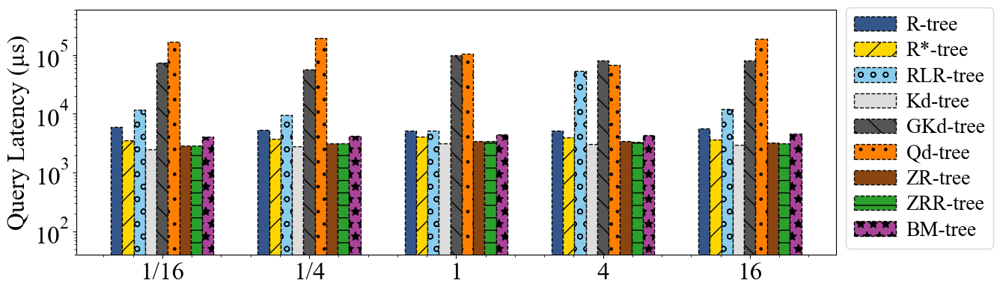

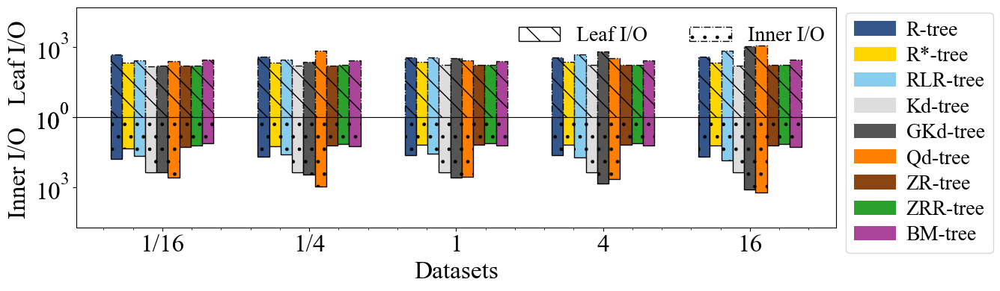

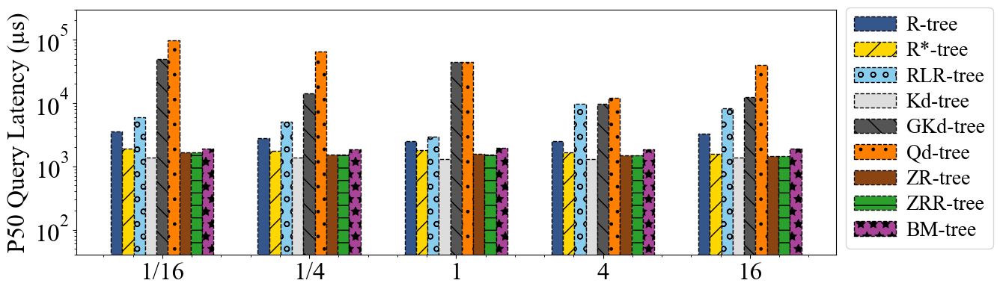

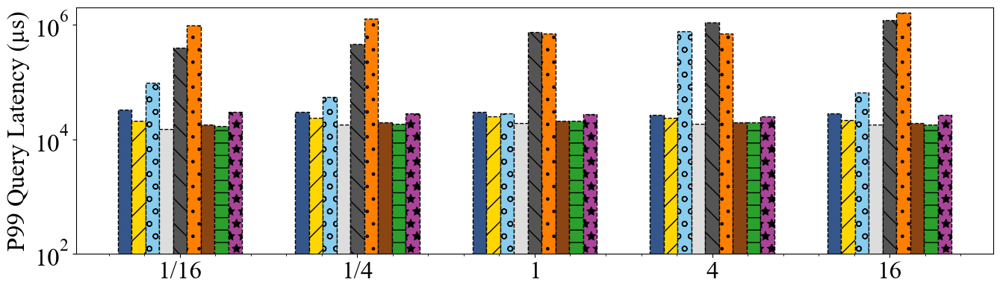

In [56]:
# 1 
data_name = "us_100000000"
query_ranges=[0.0001, 0.0005, 0.001, 0.005, 0.01]

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_{r1}x{r2}"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_{r1}x{r2}"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

query_range_r1 = [0.00025, 0.0005, 0.001, 0.002, 0.004]
query_range_r2 = [0.004, 0.002, 0.001, 0.0005, 0.00025]

# display_query_ranges = ["0.01%","0.05%","0.1%","0.5%","1%"]
display_query_ranges = ["1/16", "1/4", "1", "4", "16"]

result = []
result_num = []
IO = []

P99 = []
P50 = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for i in range(len(query_range_r1)):
        r1 = query_range_r1[i]
        r2 = query_range_r2[i]
        if data_name.startswith("data"):
            range_name = synthetic_range_name_pattern.format(r1=r1,r2=r2)
        else:
            range_name=real_range_name_pattern.format(data_name=data_name,r1=r1,r2=r2)
        
        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # dataset_IO.append(tree_property.IndexIo + tree_property.LeafIo)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        
    result.append(dataset_results) 
    result_num.append(dataset_result_num) 
    IO.append(dataset_IO) 
    P50.append(dataset_P50)
    P99.append(dataset_P99)

# print(IO)
# print(result)


# plot_hist(display_data_names, display_baselines, result_num, y_label="Result Num", output_file_paths=
#           [folder + "/figs/knn_num.pdf", "../figs/exp/knn_num.png"])

plot_hist(display_query_ranges, display_baselines, result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_time_varying_aspect_ratio.pdf", "../figs/exp_sigmod/range_query_time_varying_aspect_ratio.png"], bottom=4*1e1, top=6*1e5)

# plot_hist_stack(display_query_ranges, display_baselines, IO, y_label="I/O", is_log=True, output_file_paths=
#           [folder + "/figs/range_query_IO_varying_range.pdf", "../figs/exp/range_query_IO_varying_range.png"], legend_labels=["Leaf I/O", "Inner I/O"]
#                , bottom=1, top=5*1e4)

plot_hist_stack_mirrored(display_query_ranges, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_IO_varying_aspect_ratio.pdf", "../figs/exp_sigmod/range_query_IO_varying_aspect_ratio.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=50000, bottom2=1, top2=50000)

plot_hist(display_query_ranges, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P50_varying_aspect_ratio.pdf", "../figs/exp_sigmod/range_query_P50_varying_aspect_ratio.png"], bottom=4*1e1, top=3*1e5)

plot_hist(display_query_ranges, display_baselines, P99, y_label="P99 Query Latency (µs)", is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P99_varying_aspect_ratio.pdf", "../figs/exp_sigmod/range_query_P99_varying_aspect_ratio.png"], bottom=1e2, top=2*1e6)

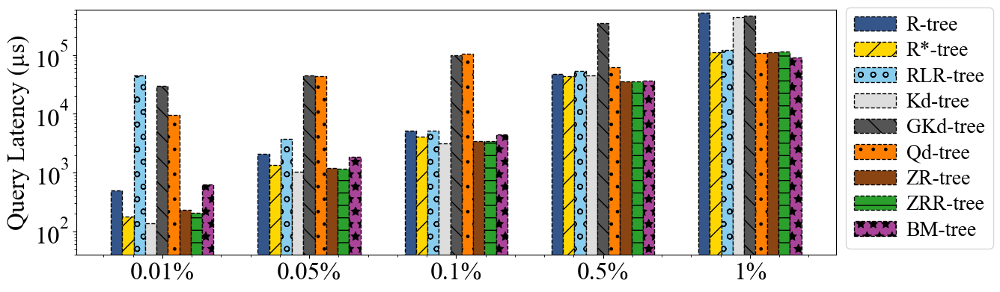

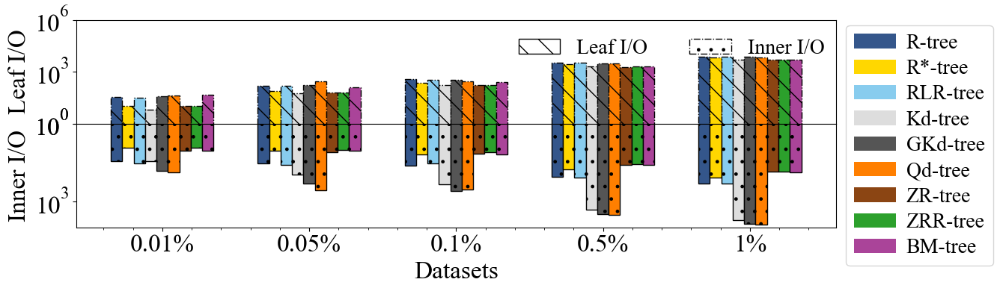

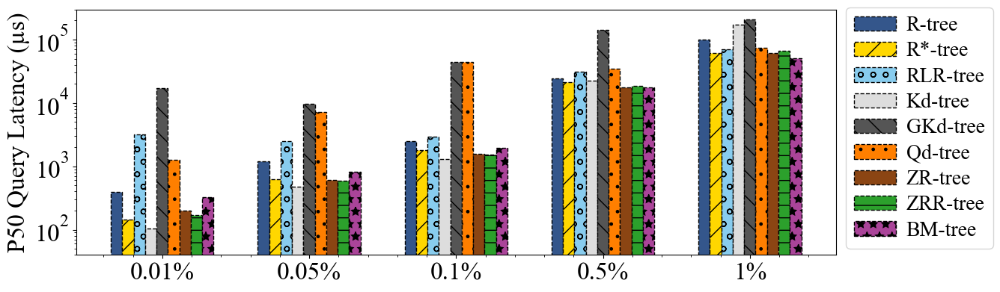

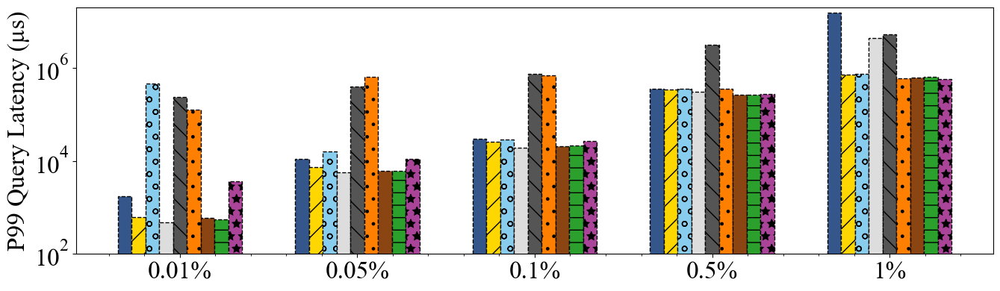

In [57]:
# 1 
data_name = "us_100000000"
query_ranges=[0.0001, 0.0005, 0.001, 0.005, 0.01]

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_{r1}x{r2}"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_{r1}x{r2}"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

display_query_ranges = ["0.01%","0.05%","0.1%","0.5%","1%"]

result = []
result_num = []
IO = []

P99 = []
P50 = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for query_range in query_ranges:

        if data_name.startswith("data"):
            range_name = synthetic_range_name_pattern.format(r1=query_range,r2=query_range)
        else:
            range_name=real_range_name_pattern.format(data_name=data_name,r1=query_range,r2=query_range)
        
        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # dataset_IO.append(tree_property.IndexIo + tree_property.LeafIo)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        
    result.append(dataset_results) 
    result_num.append(dataset_result_num) 
    IO.append(dataset_IO) 
    P50.append(dataset_P50)
    P99.append(dataset_P99)

# print(IO)
# print(result)


# plot_hist(display_data_names, display_baselines, result_num, y_label="Result Num", output_file_paths=
#           [folder + "/figs/knn_num.pdf", "../figs/exp/knn_num.png"])

plot_hist(display_query_ranges, display_baselines, result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_time_varying_range.pdf", "../figs/exp_sigmod/range_query_time_varying_range.png"], bottom=4*1e1, top=6*1e5)

# plot_hist_stack(display_query_ranges, display_baselines, IO, y_label="I/O", is_log=True, output_file_paths=
#           [folder + "/figs/range_query_IO_varying_range.pdf", "../figs/exp/range_query_IO_varying_range.png"], legend_labels=["Leaf I/O", "Inner I/O"]
#                , bottom=1, top=5*1e4)

plot_hist_stack_mirrored(display_query_ranges, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_IO_varying_range.pdf", "../figs/exp_sigmod/range_query_IO_varying_range.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=1000000, bottom2=1, top2=10000)

plot_hist(display_query_ranges, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P50_varying_range.pdf", "../figs/exp_sigmod/range_query_P50_varying_range.png"], bottom=4*1e1, top=3*1e5)

plot_hist(display_query_ranges, display_baselines, P99, y_label="P99 Query Latency (µs)", is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_P99_varying_range.pdf", "../figs/exp_sigmod/range_query_P99_varying_range.png"], bottom=1e2, top=2*1e7)

#### knn Query

[[1074.3918489999999, 865.5897070000001, 1303.857013, 777.98629, 1493.855264, 1278.8189539999998], [281.54929, 285.101924, 390.417033, 225.10866000000001, 273.359782, 356.02364], [1084.296223, 744.453575, 1029.950114, 506.061198, 784.1328490000001, 1361.123956], [156.942899, 151.58467800000003, 142.898204, 142.309953, 174.12869, 217.457587], [3545.9654530000003, 399.147242, 378.303911, 348.063978, 304.311277, 195.869519], [3213.800694, 1893.348043, 1320.808292, 1283.5473729999999, 756.222621, 5179.475136], [485.903685, 490.906935, 540.46098, 550.4648109999999, 523.841192, 459.139454], [394.557005, 396.302038, 407.57998100000003, 354.076282, 389.95300699999996, 467.508896], [1947.409389, 2296.70145, 136820.02403799997, 640.833736, 548.9912380000001, 504.18390899999997]]


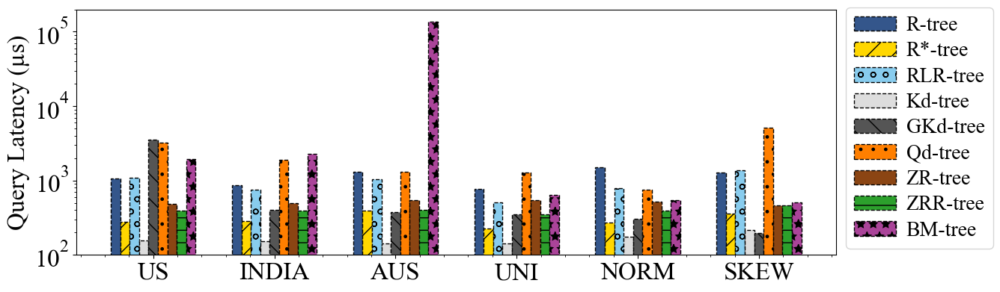

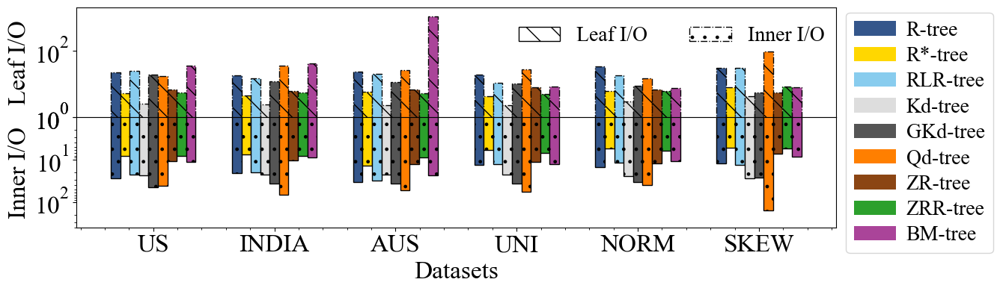

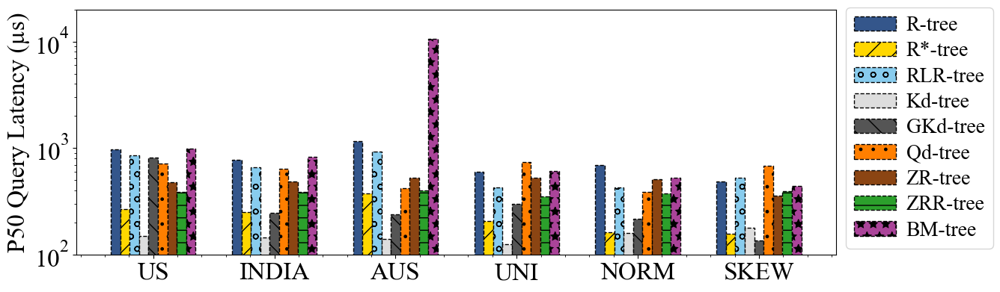

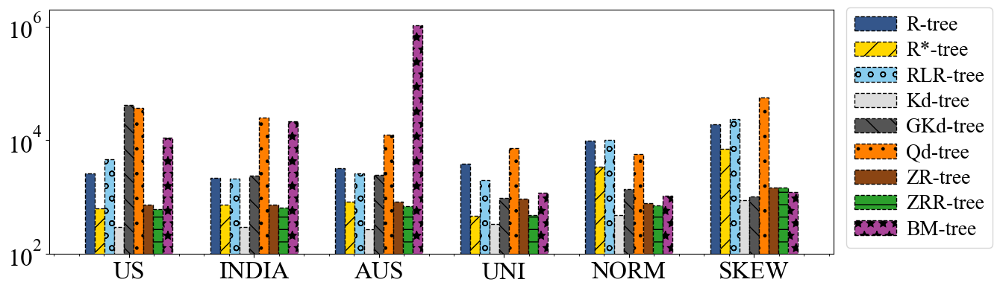

In [15]:
# 1 
data_name = "us_100000000"
k=25
real_knn_name = "{data_name}_knn_1000_2_uniform_1"
synthetic_knn_name = "knn_1000_2_uniform_1"
knn_result_name_pattern = "{data_name}{default_range_name}_{knn_name}_k_{k}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

result = []
result_num = []
IO = []

P99 = []
P50 = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for data_name in data_names:

        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
            knn_name = synthetic_knn_name
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            knn_name = real_knn_name.format(data_name=data_name)
        
        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # print(tree_property.QueryNum, data_name, baseline)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        
    result.append(dataset_results) 
    result_num.append(dataset_result_num) 
    IO.append(dataset_IO) 
    P50.append(dataset_P50)
    P99.append(dataset_P99)

print(result)

# print(IO)
# plot_hist(display_data_names, display_baselines, result_num, y_label="Result Num", output_file_paths=
#           [folder + "/figs/knn_num.pdf", "../figs/exp/knn_num.png"])

plot_hist(display_data_names, display_baselines, result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_time.pdf", "../figs/exp_sigmod/knn_query_time.png"], bottom=1e2, top=2*1e5)

# plot_hist_stack(display_data_names, display_baselines, IO, y_label="I/O", is_log=False, output_file_paths=
#           [folder + "/figs/knn_query_IO.pdf", "../figs/exp/knn_query_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"], bottom=0, top=150)

plot_hist_stack_mirrored(display_data_names, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_IO.pdf", "../figs/exp_sigmod/knn_query_IO.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=2*1000, bottom2=1, top2=400)

plot_hist(display_data_names, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_P50.pdf", "../figs/exp_sigmod/knn_query_P50.png"], bottom=1e2, top=2*1e4)

plot_hist(display_data_names, display_baselines, P99, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_P99.pdf", "../figs/exp_sigmod/knn_query_P99.png"], bottom=1e2, top=2*1e6)

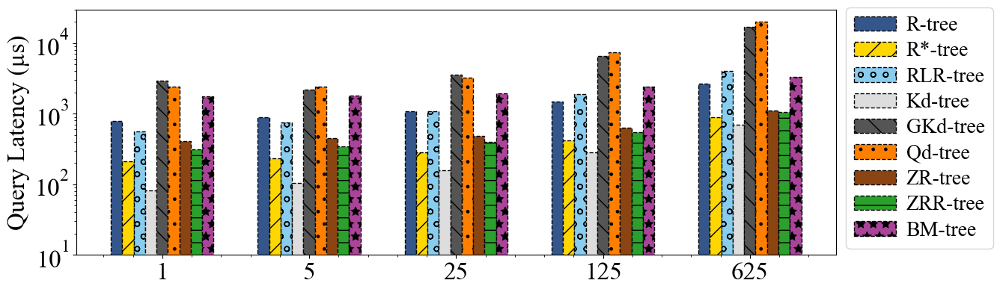

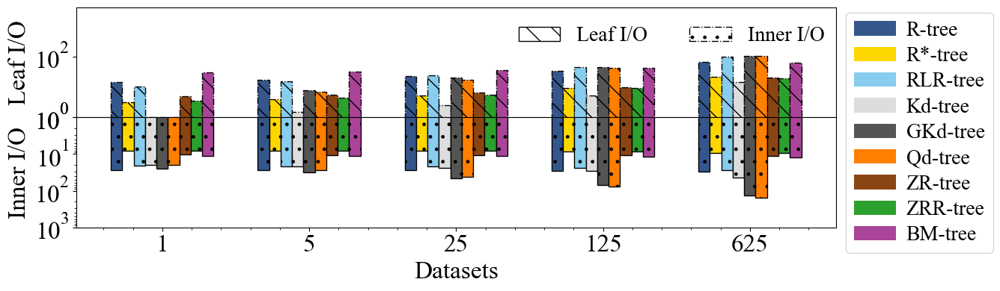

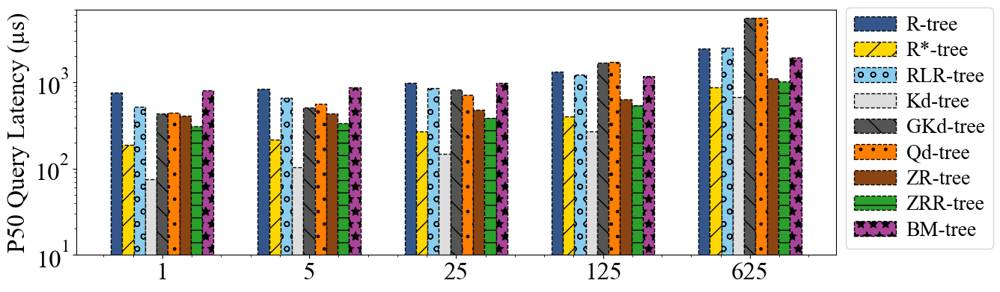

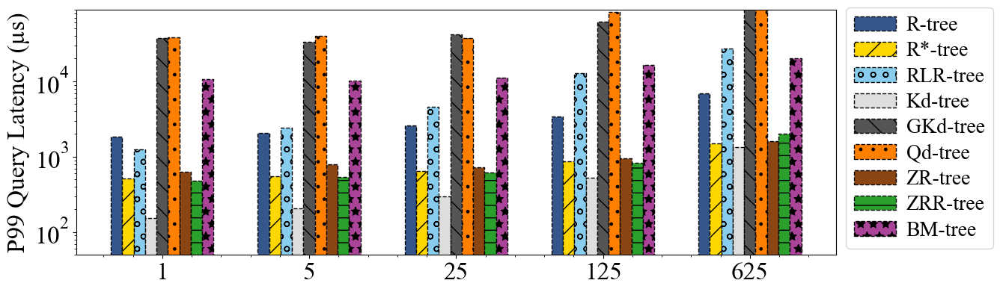

In [16]:
# 1 
data_name = "us_100000000"
ks=[1, 5, 25, 125, 625]
real_knn_name = "{data_name}_knn_1000_2_uniform_1"
synthetic_knn_name = "knn_1000_2_uniform_1"
knn_result_name_pattern = "{data_name}{default_range_name}_{knn_name}_k_{k}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

display_ks = [str(k) for k in ks]

result = []
result_num = []
IO = []

P99 = []
P50 = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    for k in ks:

        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
            knn_name = synthetic_knn_name
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            knn_name = real_knn_name.format(data_name=data_name)
        
        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.QueryMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        # dataset_IO.append(tree_property.IndexIo + tree_property.LeafIo)
        dataset_IO.append([tree_property.LeafIo / tree_property.QueryNum, tree_property.IndexIo / tree_property.QueryNum])
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        
    result.append(dataset_results) 
    result_num.append(dataset_result_num) 
    IO.append(dataset_IO) 
    P50.append(dataset_P50)
    P99.append(dataset_P99)


# plot_hist(display_data_names, display_baselines, result_num, y_label="Result Num", output_file_paths=
#           [folder + "/figs/knn_num.pdf", "../figs/exp/knn_num.png"])

plot_hist(display_ks, display_baselines, result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_time_varying_k.pdf", "../figs/exp_sigmod/knn_query_time_varying_k.png"], bottom=1e1, top=3*1e4)

# plot_line(display_ks, display_baselines, IO, y_label="I/O", is_log=True, output_file_paths=
#           [folder + "/figs/knn_query_IO_varying_k.pdf", "../figs/exp/knn_query_IO_varying_k.png"])

# plot_hist_stack(display_ks, display_baselines, IO, y_label="I/O", is_log=True, output_file_paths=
#           [folder + "/figs/knn_query_IO_varying_k.pdf", "../figs/exp/knn_query_IO_varying_k.png"], legend_labels=["Leaf I/O", "Inner I/O"]
#                , bottom=0.9)

plot_hist_stack_mirrored(display_ks, display_baselines, IO, y_label="I/O",  is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_IO_varying_k.pdf", "../figs/exp_sigmod/knn_query_IO_varying_k.png"], legend_labels=["Leaf I/O", "Inner I/O"],legend_location="right", 
                bottom1=1, top1=4*1000, bottom2=1, top2=1000)

plot_hist(display_ks, display_baselines, P50, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_P50_varying_k.pdf", "../figs/exp_sigmod/knn_query_P50_varying_k.png"], bottom=1e1, top=7*1e3)

plot_hist(display_ks, display_baselines, P99, y_label="P99 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_P99_varying_k.pdf", "../figs/exp_sigmod/knn_query_P99_varying_k.png"], bottom=5*1e1, top=9*1e4)

### Read heavy

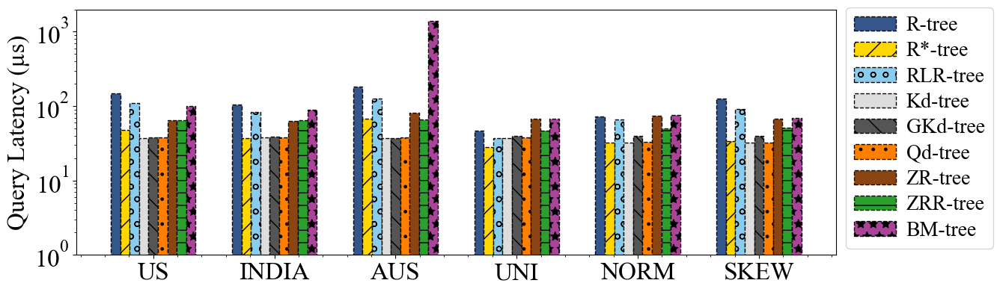

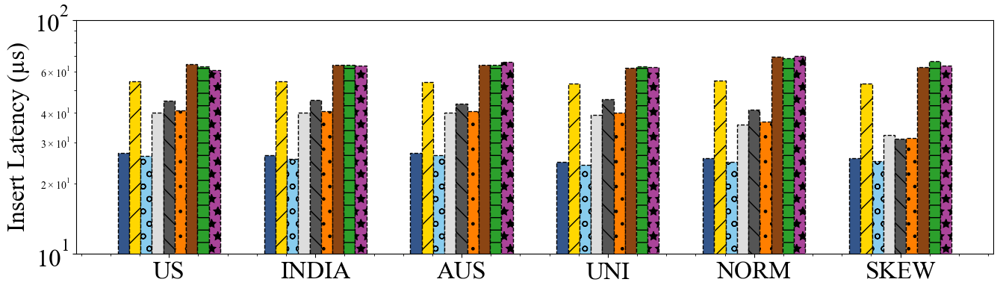

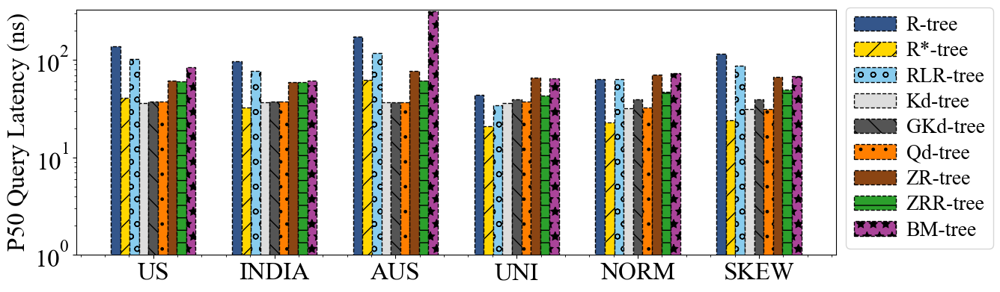

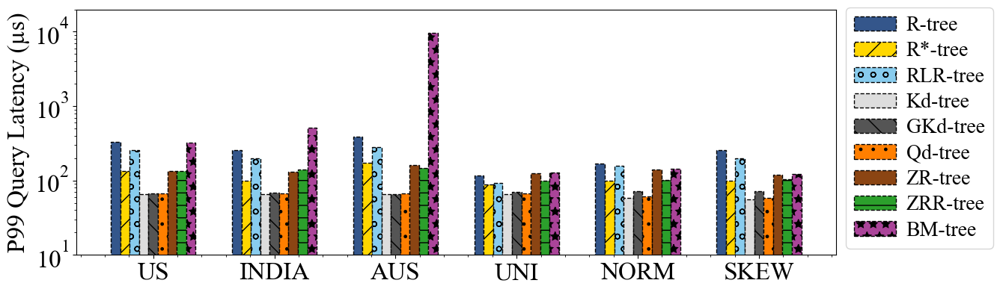

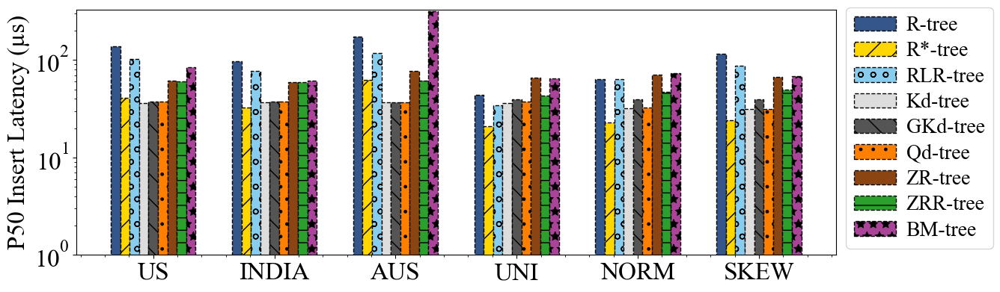

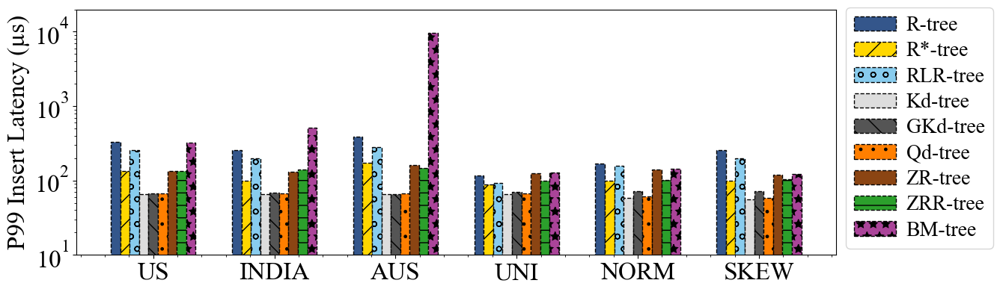

In [59]:
# 1 
synthetic_insert_point_name = "insert_point_10000000_{data_name}_2_uniform_1"
insert_point_result_name_pattern = "{data_name}{default_range_name}_{insert_point_name}_2_18{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']
real_insert_point_name = "{data_name}_insert_point_10000000_2_uniform_1"
default_range_name = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_insert_name = "insert_10000000_2_uniform_1"
real_insert_name = "{data_name}_insert_10000000_2_uniform_1"
insert_result_name_pattern = "{data_name}{default_range_name}_{insert_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

insert_result = []
query_result = []

P99 = []
P50 = []


splits = []
adjustments = []
reads = []
writes = []


for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_query_results = []
    dataset_insert_results = []
    dataset_P50 = []
    dataset_P99 = []
    dataset_splits = []
    dataset_adjustments = []
    dataset_reads = []
    dataset_writes = []
    for data_name in data_names_write:  
            
        if data_name.startswith("data"):
            insert_point_name = synthetic_insert_point_name.format(data_name=data_name) 
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            insert_point_name=real_insert_point_name.format(data_name=data_name) 
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
        
            
        insert_point_result_name = insert_point_result_name_pattern.format(
            data_name=data_name,
            insert_point_name=insert_point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(insert_point_result_path.format(name=baseline), insert_point_result_name)
        tree_property = parse_rtree_properties(res)

        dataset_query_results.append(float(tree_property.QueryMean / 1000))
        dataset_insert_results.append(float(tree_property.InsertMean / 1000))
        dataset_P50.append(tree_property.QueryP50 / 1000)
        dataset_P99.append(tree_property.QueryP99 / 1000)
        dataset_reads.append(tree_property.Reads)
        dataset_writes.append(tree_property.Writes)
        dataset_splits.append(tree_property.Splits * 1.0 / 100000)
        dataset_adjustments.append(tree_property.Adjustments)
        
    query_result.append(dataset_query_results) 
    insert_result.append(dataset_insert_results) 
    P50.append(dataset_P50)
    P99.append(dataset_P99)
    reads.append(dataset_reads)
    writes.append(dataset_writes)
    splits.append(dataset_splits)
    adjustments.append(dataset_adjustments)

plot_hist(display_data_names, display_baselines, query_result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_query_time.pdf", "../figs/exp_sigmod/read_heavy_query_time.png"], bottom=1, top=2*1e3)

plot_hist(display_data_names, display_baselines, insert_result, y_label="Insert Latency (µs)", is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_insert_time.pdf", "../figs/exp_sigmod/read_heavy_insert_time.png"], bottom=1e1, top=1e2)

plot_hist(display_data_names, display_baselines, P50, y_label="P50 Query Latency (ns)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_query_time_P50.pdf", "../figs/exp_sigmod/read_heavy_query_time_P50.png"])

plot_hist(display_data_names, display_baselines, P99, y_label="P99 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_query_time_P99.pdf", "../figs/exp_sigmod/read_heavy_query_time_P99.png"], bottom=1e1, top=2*1e4)

plot_hist(display_data_names, display_baselines, P50, y_label="P50 Insert Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_insert_time_P50.pdf", "../figs/exp_sigmod/read_heavy_insert_time_P50.png"])

plot_hist(display_data_names, display_baselines, P99, y_label="P99 Insert Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/read_heavy_insert_time_P99.pdf", "../figs/exp_sigmod/read_heavy_insert_time_P99.png"], bottom=1e1, top=2*1e4)

# plot_hist(display_data_names, display_baselines, splits, y_label="Split Ratio (%)", output_file_paths=
#           [folder + "/figs/read_heavy_splits.pdf", "../figs/exp/read_heavy_splits.png"], top=0.5)


### Write only

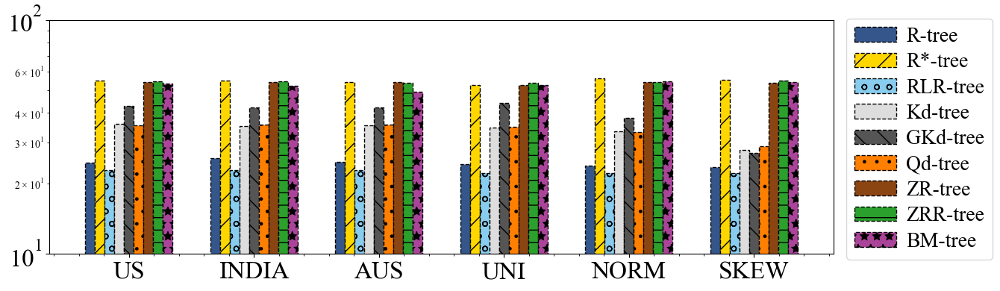

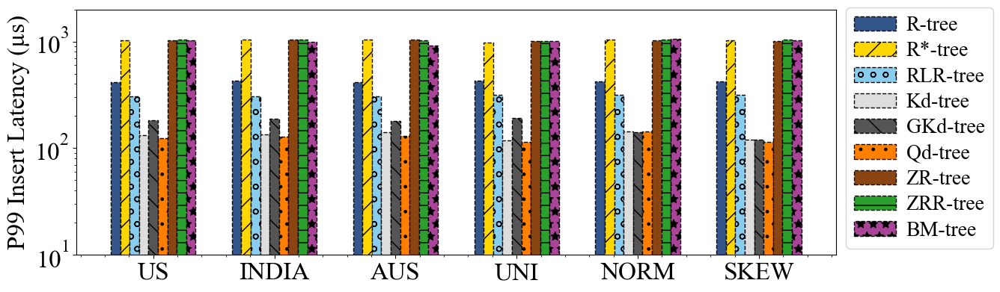

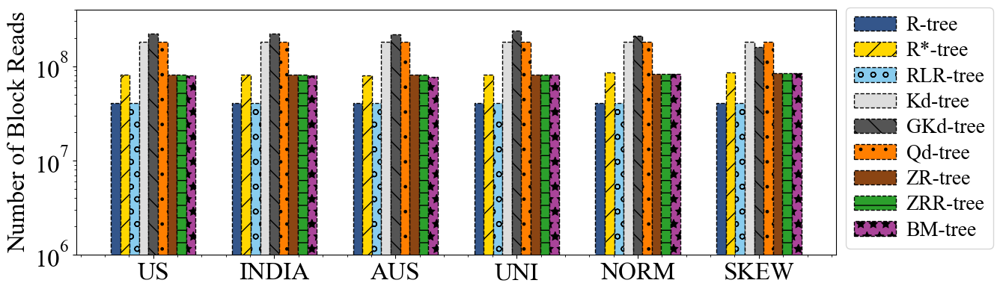

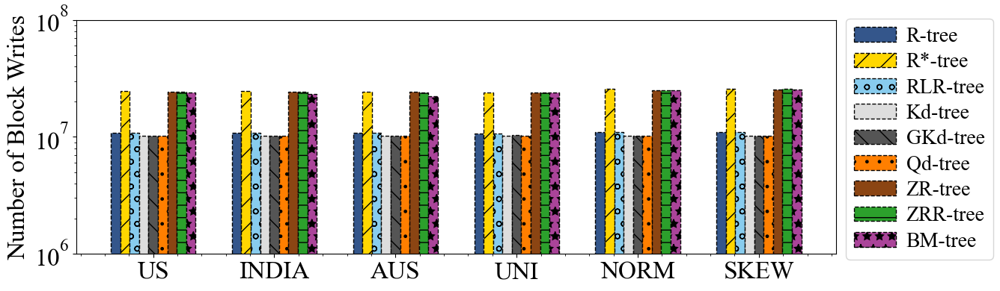

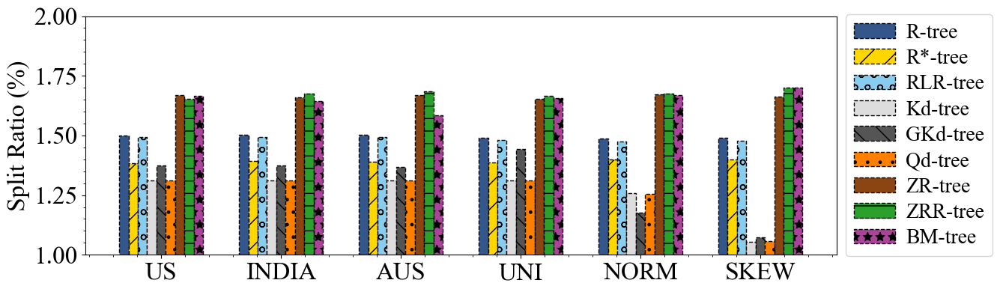

In [18]:
# 1 
data_name = "OSM_10000"
real_insert_point_name = "{data_name}_insert_point_10000000_2_uniform_1"
default_range_name = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_insert_name = "insert_10000000_2_uniform_1"
real_insert_name = "{data_name}_insert_10000000_2_uniform_1"
insert_result_name_pattern = "{data_name}{default_range_name}_{insert_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']
result = []
IO = []
result_num = []

P99 = []
P50 = []

splits = []
adjustments = []
reads = []
writes = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_results = []
    dataset_result_num = []
    dataset_IO = []
    dataset_P50 = []
    dataset_P99 = []
    dataset_splits = []
    dataset_adjustments = []
    dataset_reads = []
    dataset_writes = []
    for data_name in data_names_write:        

        if data_name.startswith("data"):
            insert_name = synthetic_insert_name
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            insert_name=real_insert_name.format(data_name=data_name) 
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
        
        insert_result_name = insert_result_name_pattern.format(
            data_name=data_name,
            insert_name=insert_name,
            default_range_name=default_range_name,
            suffix=suffix
        )

        # print(insert_result_path.format(name=baseline), insert_result_name)
        res = os.path.join(insert_result_path.format(name=baseline), insert_result_name)
        
        tree_property = parse_rtree_properties(res)

        dataset_results.append(float(tree_property.InsertMean / 1000))
        dataset_result_num.append(tree_property.QueryResults)
        dataset_IO.append(tree_property.IndexIo + tree_property.LeafIo)
        dataset_P50.append(tree_property.InsertP50 / 1000)
        dataset_P99.append(tree_property.InsertP99 / 1000)
        dataset_reads.append(tree_property.Reads)
        dataset_writes.append(tree_property.Writes)
        dataset_splits.append(tree_property.Splits * 1.0 / 100000)
        dataset_adjustments.append(tree_property.Adjustments)

    result.append(dataset_results)
    result_num.append(dataset_result_num)
    IO.append(dataset_IO)
    P50.append(dataset_P50)
    P99.append(dataset_P99)
    reads.append(dataset_reads)
    writes.append(dataset_writes)
    splits.append(dataset_splits)
    adjustments.append(dataset_adjustments)

plot_hist(display_data_names, display_baselines, result, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_only.pdf", "../figs/exp_sigmod/write_only.png"], bottom=1e1, top=1e2)

# plot_hist(display_data_names, display_baselines, P50, y_label="P50 Insert Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/write_only_P50.pdf", "../figs/exp/write_only_P50.png"])

plot_hist(display_data_names, display_baselines, P99, y_label="P99 Insert Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_only_P99.pdf", "../figs/exp_sigmod/write_only_P99.png"], bottom=1e1, top=2*1e3)

plot_hist(display_data_names, display_baselines, reads, y_label="Number of Block Reads", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_only_reads.pdf", "../figs/exp_sigmod/write_only_reads.png"], bottom=1e6, top=4*1e8)

plot_hist(display_data_names, display_baselines, writes, y_label="Number of Block Writes", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_only_writes.pdf", "../figs/exp_sigmod/write_only_writes.png"], bottom=1e6, top=1e8)

plot_hist(display_data_names, display_baselines, splits, y_label="Split Ratio (%)", output_file_paths=
          [folder + "/exp_sigmod/write_only_splits.pdf", "../figs/exp_sigmod/write_only_splits.png"], top=2.0)

# plot_hist(display_data_names, display_baselines, adjustments, y_label="# of adjustments", is_log=True, output_file_paths=
#           [folder + "/figs/write_only_adjustments.pdf", "../figs/exp/write_only_adjustments.png"])


### Balanced

In [19]:
# # 1 
# data_name = "us_10000000"
# default_range_name = "_{data_name}_range_1000_2_uniform_1_0.001x0.001_2_uniform_1"
# insert_point_result_name_pattern = "{data_name}{default_range_name}_{insert_point_name}_10_10{suffix}.txt"
# special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

# insert_result = []
# query_result = []

# P99_query = []
# P50_query = []
# P99_insert = []
# P50_insert = []


# splits = []
# adjustments = []
# reads = []
# writes = []


# for baseline in baselines:
#     suffix = baseline_suffix[baseline]
#     dataset_query_results = []
#     dataset_insert_results = []
#     dataset_P50_Q = []
#     dataset_P99_Q = []
#     dataset_P50_I = []
#     dataset_P99_I = []
#     dataset_splits = []
#     dataset_adjustments = []
#     dataset_reads = []
#     dataset_writes = []
#     for data_name in data_names_write:  

#         if data_name.startswith("data"):
#             insert_point_name = synthetic_insert_point_name.format(data_name=data_name) 
#             default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
#         else:
#             insert_point_name=real_insert_point_name.format(data_name=data_name) 
#             default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
        
            
#         insert_point_result_name = insert_point_result_name_pattern.format(
#             data_name=data_name,
#             insert_point_name=insert_point_name,
#             default_range_name=default_range_name,
#             suffix=suffix
#         )
#         res = os.path.join(insert_point_result_path.format(name=baseline), insert_point_result_name)
#         tree_property = parse_rtree_properties(res)

#         dataset_query_results.append(float(tree_property.QueryMean / 1000))
#         dataset_insert_results.append(float(tree_property.InsertMean / 1000))
#         dataset_P50_Q.append(tree_property.QueryP50 / 1000)
#         dataset_P99_Q.append(tree_property.QueryP99 / 1000)
#         dataset_P50_I.append(tree_property.InsertP50 / 1000)
#         dataset_P99_I.append(tree_property.InsertP99 / 1000)
#         dataset_reads.append(tree_property.Reads)
#         dataset_writes.append(tree_property.Writes)
#         dataset_splits.append(tree_property.Splits * 1.0 / 100000)
#         dataset_adjustments.append(tree_property.Adjustments)
        
#     query_result.append(dataset_query_results) 
#     insert_result.append(dataset_insert_results) 
#     P50_query.append(dataset_P50_Q)
#     P99_query.append(dataset_P99_Q)
#     P50_insert.append(dataset_P50_I)
#     P99_insert.append(dataset_P99_I)
#     reads.append(dataset_reads)
#     writes.append(dataset_writes)
#     splits.append(dataset_splits)
#     adjustments.append(dataset_adjustments)

# plot_hist(display_data_names, display_baselines, query_result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/balanced_query_time.pdf", "../figs/exp/balanced_query_time.png"], bottom=1, top=2*1e3)
# plot_hist(display_data_names, display_baselines, insert_result, y_label="Insert Latency (µs)", is_legend=False, is_log=True, output_file_paths=
#           [folder + "/figs/balanced_insert_time.pdf", "../figs/exp/balanced_insert_time.png"], bottom=1e1, top=1e2)

# plot_hist(display_data_names, display_baselines, P50_query, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/balanced_query_time_P50.pdf", "../figs/exp/balanced_query_P50.png"], bottom=1, top=1e3)

# plot_hist(display_data_names, display_baselines, P99_query, y_label="P99 Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/balanced_query_time_P99.pdf", "../figs/exp/balanced_query_time_P99.png"], bottom=1e1, top=2*1e4)

# plot_hist(display_data_names, display_baselines, P50_insert, y_label="P50 Insert Latency (µs)", is_log=False, output_file_paths=
#           [folder + "/figs/balanced_insert_time_P50.pdf", "../figs/exp/balanced_insert_time_P50.png"], bottom=1e1, top=3*1e1)

# plot_hist(display_data_names, display_baselines, P99_insert, y_label="P99 Insert Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/balanced_insert_time_P99.pdf", "../figs/exp/balanced_insert_time_P99.png"], bottom=1e1, top=2*1e3)

# plot_hist(display_data_names, display_baselines, splits, y_label="Split Ratio (%)", output_file_paths=
#           [folder + "/figs/balanced_splits.pdf", "../figs/exp/balanced_splits.png"], bottom=0, top=1.5)

### Write heavy

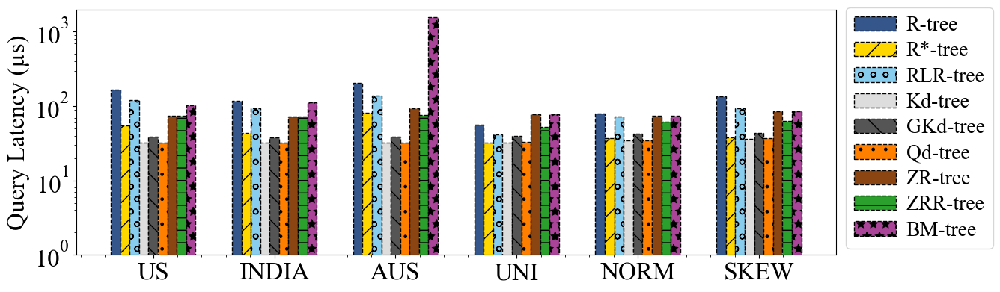

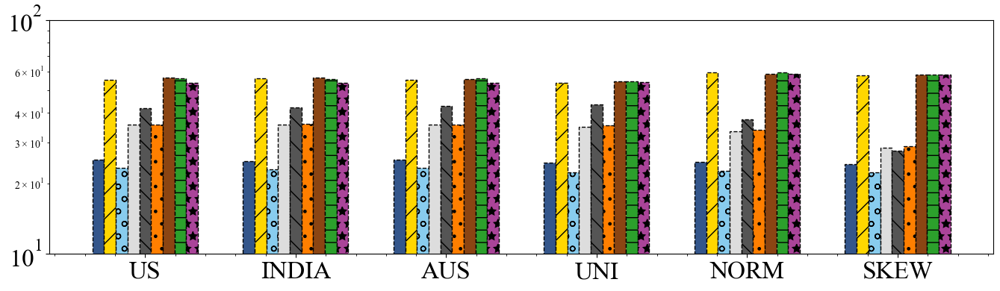

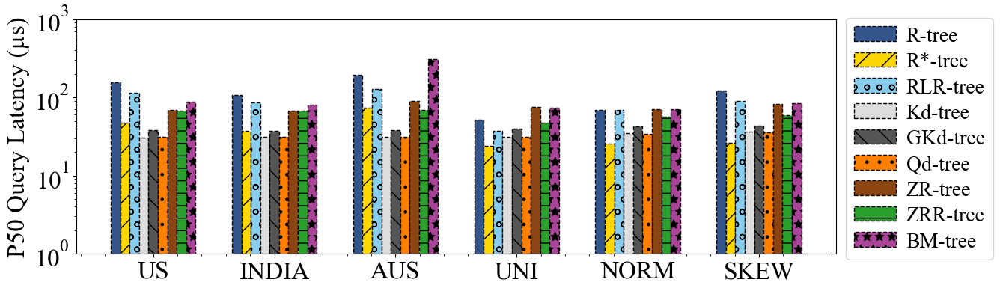

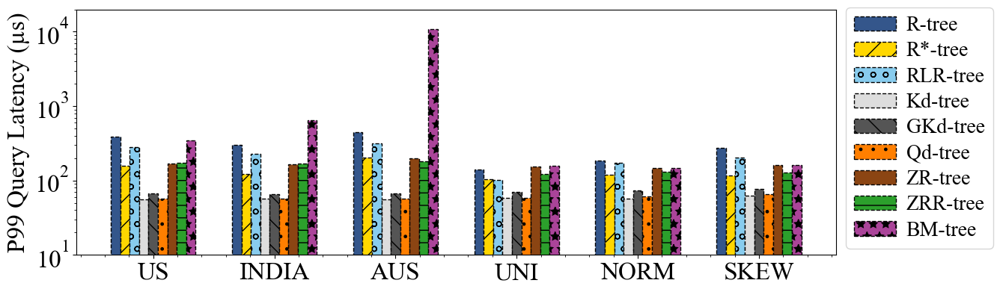

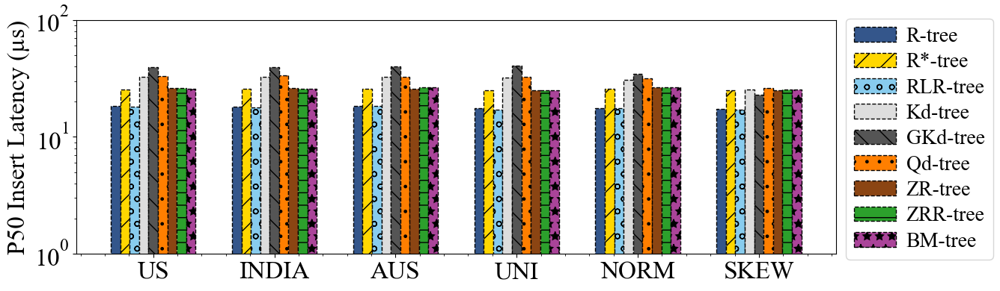

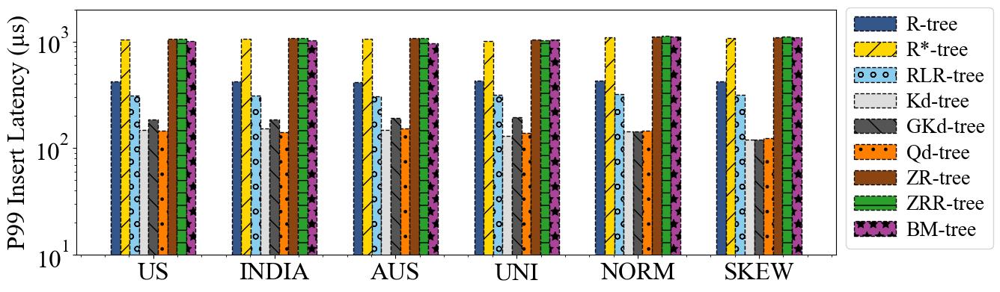

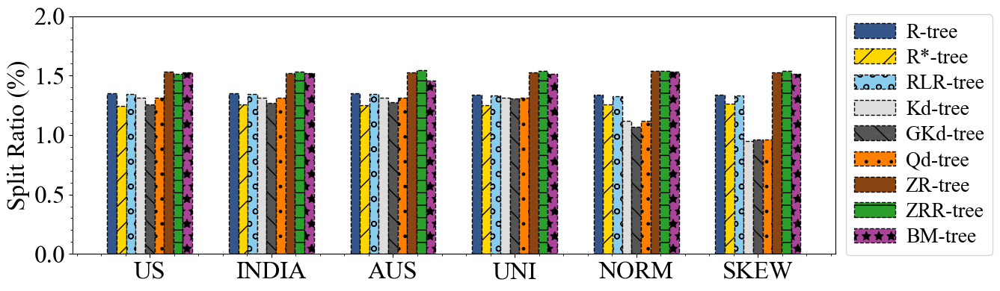

In [20]:
# 1 
insert_point_result_name_pattern = "{data_name}{default_range_name}_{insert_point_name}_18_2{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

insert_result = []
query_result = []


P99_query = []
P50_query = []
P99_insert = []
P50_insert = []

splits = []
adjustments = []
reads = []
writes = []

for baseline in baselines:
    suffix = baseline_suffix[baseline]
    dataset_query_results = []
    dataset_insert_results = []
    dataset_P50_Q = []
    dataset_P99_Q = []
    dataset_P50_I = []
    dataset_P99_I = []
    dataset_splits = []
    dataset_adjustments = []
    dataset_reads = []
    dataset_writes = []
    for data_name in data_names_write:  
            
        if data_name.startswith("data"):
            insert_point_name = synthetic_insert_point_name.format(data_name=data_name) 
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            insert_point_name=real_insert_point_name.format(data_name=data_name) 
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
        
            
        insert_point_result_name = insert_point_result_name_pattern.format(
            data_name=data_name,
            insert_point_name=insert_point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )

        # print(insert_point_result_path.format(name=baseline), insert_point_result_name)
        
        res = os.path.join(insert_point_result_path.format(name=baseline), insert_point_result_name)
        tree_property = parse_rtree_properties(res)

        dataset_query_results.append(float(tree_property.QueryMean / 1000))
        dataset_insert_results.append(float(tree_property.InsertMean / 1000))
        dataset_P50_Q.append(tree_property.QueryP50 / 1000)
        dataset_P99_Q.append(tree_property.QueryP99 / 1000)
        dataset_P50_I.append(tree_property.InsertP50 / 1000)
        dataset_P99_I.append(tree_property.InsertP99 / 1000)
        dataset_reads.append(tree_property.Reads)
        dataset_writes.append(tree_property.Writes)
        dataset_splits.append(tree_property.Splits * 1.0 / 100000) # 1/100000 = 1/10000000 * 100
        dataset_adjustments.append(tree_property.Adjustments)
        
    query_result.append(dataset_query_results) 
    insert_result.append(dataset_insert_results) 
    P50_query.append(dataset_P50_Q)
    P99_query.append(dataset_P99_Q)
    P50_insert.append(dataset_P50_I)
    P99_insert.append(dataset_P99_I)
    reads.append(dataset_reads)
    writes.append(dataset_writes)
    splits.append(dataset_splits)
    adjustments.append(dataset_adjustments)

plot_hist(display_data_names, display_baselines, query_result, y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_query_time.pdf", "../figs/exp_sigmod/write_heavy_query_time.png"], bottom=1, top=2*1e3)
plot_hist(display_data_names, display_baselines, insert_result, is_legend=False, is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_insert_time.pdf", "../figs/exp_sigmod/write_heavy_insert_time.png"], bottom=1e1, top=1e2)

plot_hist(display_data_names, display_baselines, P50_query, y_label="P50 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_query_time_P50.pdf", "../figs/exp_sigmod/write_heavy_query_time_P50.png"], bottom=1, top=1e3)

plot_hist(display_data_names, display_baselines, P99_query, y_label="P99 Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_query_time_P99.pdf", "../figs/exp_sigmod/write_heavy_query_time_P99.png"], bottom=1e1, top=2*1e4)

plot_hist(display_data_names, display_baselines, P50_insert, y_label="P50 Insert Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_insert_time_P50.pdf", "../figs/exp_sigmod/write_heavy_insert_time_P50.png"], bottom=1, top=1e2)

plot_hist(display_data_names, display_baselines, P99_insert, y_label="P99 Insert Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/write_heavy_insert_time_P99.pdf", "../figs/exp_sigmod/write_heavy_insert_time_P99.png"], bottom=1e1, top=2*1e3)

plot_hist(display_data_names, display_baselines, splits, y_label="Split Ratio (%)", output_file_paths=
          [folder + "/exp_sigmod/write_heavy_splits.pdf", "../figs/exp_sigmod/write_heavy_splits.png"], bottom=0, top=2.0)

In [21]:
data_names = ["us_100000000", "india_100000000", "australia_100000000", "data_100000000_2_uniform_1", "data_100000000_2_normal_1", "data_100000000_2_skewed_4"]
data_names_write = ["us_10000000", "india_10000000", "australia_10000000", "data_10000000_2_uniform_1", "data_10000000_2_normal_1", "data_10000000_2_skewed_4"]
display_data_names = ["US", "INDIA", "AUS", "UNI", "NORM", "SKEW"]

real_default_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_default_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
build_result_name_pattern = "{data_name}{default_range_name}{suffix}.txt"

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

real_point_name = "{data_name}_point_200000_2_uniform_1"
synthetic_point_name = "point_200000_{data_name}_2_uniform_1"
point_result_name_pattern = "{data_name}{default_range_name}_{point_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']

insert_point_result_name_pattern = "{data_name}{default_range_name}_{insert_point_name}_10_10{suffix}.txt"
synthetic_insert_name = "insert_10000000_2_uniform_1"
real_insert_name = "{data_name}_insert_10000000_2_uniform_1"
insert_result_name_pattern = "{data_name}{default_range_name}_{insert_name}{suffix}.txt"

spider_build_time = []
spider_index_size = []
spider_point_query = []
spider_range_query = []
spider_knn_query = []
spider_balanced = []
spider_write_only = []

for data_name, data_name_write in zip(data_names, data_names_write):

    dict_spider_build_time = {}
    dict_spider_index_size = {}
    dict_spider_point_query = {}
    dict_spider_range_query = {}
    dict_spider_knn_query = {}
    dict_spider_balanced = {}
    dict_spider_write_only = {}

    for baseline, display_baseline in zip(baselines, display_baselines):
        suffix = baseline_suffix[baseline]
        
        default_range_name = ''
        default_range_name_write = ''
        if baseline in special_baselines:
            if data_name.startswith("data"):
                default_range_name = synthetic_default_range_name_pattern
                default_range_name_write = default_range_name
            else:
                default_range_name = real_default_range_name_pattern.format(data_name=data_name)
                default_range_name_write = real_default_range_name_pattern.format(data_name=data_name_write)
        
        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(build_result_path.format(name=baseline), build_result_name)

        tree_property = parse_rtree_properties(res)

        dict_spider_build_time[display_baseline] = tree_property.ElapsedTime
        dict_spider_index_size[display_baseline] = tree_property.TreeDatSize + tree_property.TreeIdxSize

    # for baseline, display_baseline in zip(baselines, display_baselines):
    #     suffix = baseline_suffix[baseline]
        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
            point_name = synthetic_point_name.format(data_name=data_name)
            range_name = synthetic_range_name_pattern
            knn_name = synthetic_knn_name

            insert_name = synthetic_insert_name
            insert_point_name = synthetic_insert_point_name.format(data_name=data_name_write) 
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            point_name = real_point_name.format(data_name=data_name)
            range_name=real_range_name_pattern.format(data_name=data_name)
            knn_name = real_knn_name.format(data_name=data_name)
            
            insert_name=real_insert_name.format(data_name=data_name_write) 
            insert_point_name=real_insert_point_name.format(data_name=data_name_write) 
            
        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(point_result_path.format(name=baseline), point_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_point_query[display_baseline] = tree_property.QueryMean

        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_range_query[display_baseline] = tree_property.QueryMean

        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_knn_query[display_baseline] = tree_property.QueryMean

        insert_result_name = insert_result_name_pattern.format(
            data_name=data_name_write,
            insert_name=insert_name,
            default_range_name=default_range_name_write,
            suffix=suffix
        )
        res = os.path.join(insert_result_path.format(name=baseline), insert_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_write_only[display_baseline] = tree_property.InsertMean
        
        insert_point_result_name = insert_point_result_name_pattern.format(
            data_name=data_name_write,
            insert_point_name=insert_point_name,
            default_range_name=default_range_name_write,
            suffix=suffix
        )
        res = os.path.join(insert_point_result_path.format(name=baseline), insert_point_result_name)
        tree_property = parse_rtree_properties(res)
        # dict_spider_balanced[display_baseline] = tree_property.QueryMean
        dict_spider_balanced[display_baseline] = tree_property.InsertMean    

    ranked_spider_build_time = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_build_time.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_index_size = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_index_size.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_point_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_point_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_range_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_range_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_knn_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_knn_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_balanced = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_balanced.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_write_only = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_write_only.items(), key=lambda item: item[1], reverse=True), 1)
    }

    spider_build_time.append(ranked_spider_build_time)
    spider_index_size.append(ranked_spider_index_size)
    spider_point_query.append(ranked_spider_point_query)
    spider_range_query.append(ranked_spider_range_query)
    spider_knn_query.append(ranked_spider_knn_query)
    spider_balanced.append(ranked_spider_balanced)
    spider_write_only.append(ranked_spider_write_only)

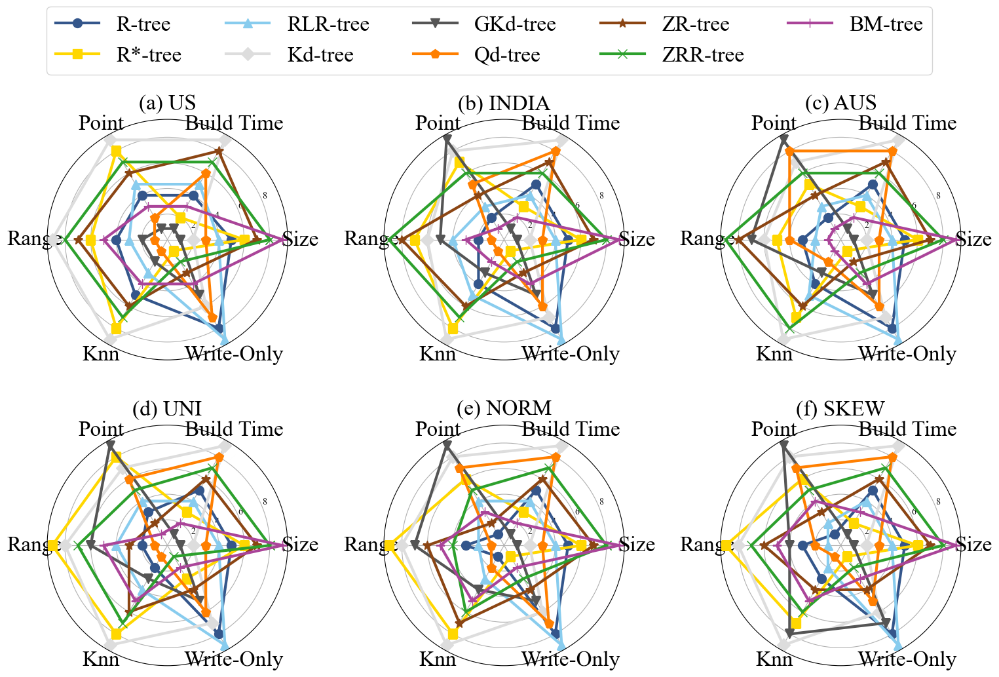

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import random

label_size = 24
legend_size = 20
categories = ['Size', 'Build Time', 'Point', 'Range', 'Knn', 'Write-Only']
letters = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]
num_vars = len(categories)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

# Define the number of subplots (2 rows, 3 columns for 6 subplots)
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 12), subplot_kw=dict(polar=True))

# Flatten the array of axes for easier iteration
axs = axs.flatten()

markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'x', '+']
linestyles = [None, None, '-', None, None, '--', None, None, '-.']

for j, ax in enumerate(axs):

    # baseline = []
    for i, display_baseline in enumerate(display_baselines):

        baseline = [
        spider_index_size[j][display_baseline],
        spider_build_time[j][display_baseline],
        spider_point_query[j][display_baseline],
        spider_range_query[j][display_baseline],
        spider_knn_query[j][display_baseline],
        # spider_balanced[j][display_baseline],
        spider_write_only[j][display_baseline]]
        # baseline = [random.randint(1, 9) for _ in range(len(categories))]
        baseline += baseline[:1]
        ax.plot(angles, baseline, color=colors[i], linewidth=3, marker=markers[i], markersize=10, label=display_baseline)


    # Fill in the labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=label_size)
    ax.set_title(letters[j] + " " + display_data_names[j], fontsize=label_size)

#     if j == 1:
#         # Add a legend for each subplot
#         ax.legend(loc='upper center', fontsize=legend_size, bbox_to_anchor=(0.5, 1.15), ncol=9)  # Adjust the position and columns

fig.legend(display_baselines, loc='upper center', fontsize=label_size, ncol=5, bbox_to_anchor=(0.5, 1.0))

        # borderaxespad=0.5,  # Border padding
        # handletextpad=0.5,  # Padding between legend marker and text
        # labelspacing=0.3    # Vertical space between legend entries

# Adjust layout to prevent overlap
# plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the legend

# plt.tight_layout(pad=1.0, w_pad=2.0, h_pad=0.0)

# pad: Padding between the figure edge and the edges of subplots.
# w_pad: Padding (width) between subplots.
# h_pad: Padding (height) between subplots.

# left, right, top, bottom: Control the margins around the entire figure.
# wspace: Controls the width space between the subplots.
# hspace: Controls the height space between the subplots.

plt.subplots_adjust(wspace=0.4, hspace=0.02)


# Adjust layout to prevent overlap
# plt.tight_layout()

plt.savefig(folder + "/exp_sigmod/spider.pdf", format='pdf', bbox_inches='tight')
plt.savefig("../figs/exp_sigmod/spider.png", format='png', bbox_inches='tight')

# Show the entire figure with all subplots
plt.show()


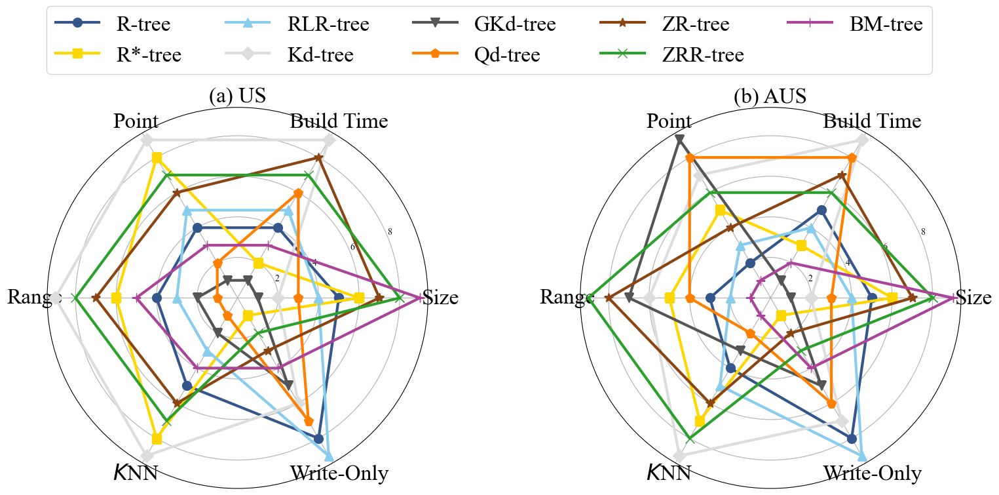

In [23]:
data_names = ["us_100000000", "australia_100000000"]
data_names_write = ["us_10000000", "australia_10000000"]
display_data_names = ["US", "AUS"]


spider_build_time = []
spider_index_size = []
spider_point_query = []
spider_range_query = []
spider_knn_query = []
spider_balanced = []
spider_write_only = []

for data_name, data_name_write in zip(data_names, data_names_write):

    dict_spider_build_time = {}
    dict_spider_index_size = {}
    dict_spider_point_query = {}
    dict_spider_range_query = {}
    dict_spider_knn_query = {}
    dict_spider_balanced = {}
    dict_spider_write_only = {}

    for baseline, display_baseline in zip(baselines, display_baselines):
        suffix = baseline_suffix[baseline]
        
        default_range_name = ''
        default_range_name_write = ''
        if baseline in special_baselines:
            if data_name.startswith("data"):
                default_range_name = synthetic_default_range_name_pattern
                default_range_name_write = default_range_name
            else:
                default_range_name = real_default_range_name_pattern.format(data_name=data_name)
                default_range_name_write = real_default_range_name_pattern.format(data_name=data_name_write)
        
        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(build_result_path.format(name=baseline), build_result_name)

        tree_property = parse_rtree_properties(res)

        dict_spider_build_time[display_baseline] = tree_property.ElapsedTime
        dict_spider_index_size[display_baseline] = tree_property.TreeDatSize + tree_property.TreeIdxSize

    # for baseline, display_baseline in zip(baselines, display_baselines):
    #     suffix = baseline_suffix[baseline]
        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
            point_name = synthetic_point_name.format(data_name=data_name)
            range_name = synthetic_range_name_pattern
            knn_name = synthetic_knn_name

            insert_name = synthetic_insert_name
            insert_point_name = synthetic_insert_point_name.format(data_name=data_name_write) 
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            point_name = real_point_name.format(data_name=data_name)
            range_name=real_range_name_pattern.format(data_name=data_name)
            knn_name = real_knn_name.format(data_name=data_name)
            
            insert_name=real_insert_name.format(data_name=data_name_write) 
            insert_point_name=real_insert_point_name.format(data_name=data_name_write) 
            
        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        res = os.path.join(point_result_path.format(name=baseline), point_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_point_query[display_baseline] = tree_property.QueryMean

        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_range_query[display_baseline] = tree_property.QueryMean

        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_knn_query[display_baseline] = tree_property.QueryMean

        insert_result_name = insert_result_name_pattern.format(
            data_name=data_name_write,
            insert_name=insert_name,
            default_range_name=default_range_name_write,
            suffix=suffix
        )
        res = os.path.join(insert_result_path.format(name=baseline), insert_result_name)
        tree_property = parse_rtree_properties(res)
        dict_spider_write_only[display_baseline] = tree_property.InsertMean
        
        insert_point_result_name = insert_point_result_name_pattern.format(
            data_name=data_name_write,
            insert_point_name=insert_point_name,
            default_range_name=default_range_name_write,
            suffix=suffix
        )
        res = os.path.join(insert_point_result_path.format(name=baseline), insert_point_result_name)
        tree_property = parse_rtree_properties(res)
        # dict_spider_balanced[display_baseline] = tree_property.QueryMean
        dict_spider_balanced[display_baseline] = tree_property.InsertMean    

    ranked_spider_build_time = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_build_time.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_index_size = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_index_size.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_point_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_point_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_range_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_range_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_knn_query = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_knn_query.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_balanced = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_balanced.items(), key=lambda item: item[1], reverse=True), 1)
    }

    ranked_spider_write_only = {
        baseline: rank for rank, (baseline, _) in enumerate(sorted(dict_spider_write_only.items(), key=lambda item: item[1], reverse=True), 1)
    }

    spider_build_time.append(ranked_spider_build_time)
    spider_index_size.append(ranked_spider_index_size)
    spider_point_query.append(ranked_spider_point_query)
    spider_range_query.append(ranked_spider_range_query)
    spider_knn_query.append(ranked_spider_knn_query)
    spider_balanced.append(ranked_spider_balanced)
    spider_write_only.append(ranked_spider_write_only)

import matplotlib.pyplot as plt
import numpy as np
import random

label_size = 24
legend_size = 20
categories = ['Size', 'Build Time', 'Point', 'Range', '$K$NN', 'Write-Only']
letters = ["(a)", "(b)"]
num_vars = len(categories)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

# Define the number of subplots (2 rows, 3 columns for 6 subplots)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 12), subplot_kw=dict(polar=True))

# Flatten the array of axes for easier iteration
axs = axs.flatten()

markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'x', '+']
linestyles = [None, None, '-', None, None, '--', None, None, '-.']

for j, ax in enumerate(axs):

    # baseline = []
    for i, display_baseline in enumerate(display_baselines):

        baseline = [
        spider_index_size[j][display_baseline],
        spider_build_time[j][display_baseline],
        spider_point_query[j][display_baseline],
        spider_range_query[j][display_baseline],
        spider_knn_query[j][display_baseline],
        # spider_balanced[j][display_baseline],
        spider_write_only[j][display_baseline]]
        # baseline = [random.randint(1, 9) for _ in range(len(categories))]
        baseline += baseline[:1]
        ax.plot(angles, baseline, color=colors[i], linewidth=3, marker=markers[i], markersize=10, label=display_baseline)


    # Fill in the labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=label_size)
    ax.set_title(letters[j] + " " + display_data_names[j], fontsize=label_size)

#     if j == 1:
#         # Add a legend for each subplot
#         ax.legend(loc='upper center', fontsize=legend_size, bbox_to_anchor=(0.5, 1.15), ncol=9)  # Adjust the position and columns

fig.legend(display_baselines, loc='upper center', fontsize=label_size, ncol=5, bbox_to_anchor=(0.5, 0.88))


plt.subplots_adjust(wspace=0.4, hspace=0.02)


# Adjust layout to prevent overlap
# plt.tight_layout()

plt.savefig(folder + "/exp_sigmod/spider.pdf", format='pdf', bbox_inches='tight')
plt.savefig("../figs/exp_sigmod/spider.png", format='png', bbox_inches='tight')

# Show the entire figure with all subplots
plt.show()


In [24]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D    

def plot_scatter(sizes, baseline_names, x, y, ax=None, x_label="", y_label="", is_log=False, title="", output_file_paths=None, x_bottom=None, x_top=None, y_bottom=None, y_top=None, show_legend=False):
    label_size = 27
    legend_size = 22

    # if show_legend:
    #     # fig, ax = plt.subplots(figsize=(8, 4))
    #     fig, ax = plt.subplots(figsize=(8 * 0.75, 4))
    # else:
    #     fig, ax = plt.subplots(figsize=(8 * 0.75, 4))
    if ax is None:
        fig, ax = plt.subplots(figsize=(8 * 0.75, 4))

    markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'x', '+']
    colors = plt.cm.tab10.colors  # Add a color palette
    for i, baseline in enumerate(baseline_names):
        # print(i, x[i], sizes)
        for j in range(len(x[i])):
            marker_size = 40 * np.log(sizes[j] / 1000)
            ax.scatter(x[i][j], y[i][j], label=baseline, marker=markers[i % len(markers)], color=colors[i % len(colors)], facecolors='none', s=marker_size)

    if x_bottom is not None:
        ax.set_xlim(left=x_bottom)
    if x_top is not None:
        ax.set_xlim(right=x_top)
    if y_bottom is not None:
        ax.set_ylim(bottom=y_bottom)
    if y_top is not None:
        ax.set_ylim(top=y_top)
        
    ax.set_ylabel(y_label, fontsize=label_size + 2)
    ax.set_xlabel(x_label, fontsize=label_size + 2)
    ax.tick_params(axis='x', labelsize=label_size + 2)
    ax.tick_params(axis='y', labelsize=label_size + 2)

    ax.set_title(title, fontsize=label_size + 2)
    
    if is_log:
        ax.set_yscale('log')
        ax.set_xscale('log')
    
    if show_legend:
        scatter_legend_element_1 = Line2D([0], [0], marker=markers[0], color=colors[0], label=baseline_names[0],
                                          markerfacecolor='none', markersize=10, linestyle='None', markeredgewidth=2)
        
        scatter_legend_element_2 = Line2D([0], [0], marker=markers[1], color=colors[1], label=baseline_names[1],
                                          markerfacecolor='none', markersize=10, linestyle='None', markeredgewidth=2)
        
        scatter_legend_element_3 = Line2D([0], [0], marker=markers[2], color=colors[2], label=baseline_names[2],
                                          markerfacecolor='none', markersize=10, linestyle='None', markeredgewidth=2)
        
        scatter_legend_elements = [scatter_legend_element_1, scatter_legend_element_2, scatter_legend_element_3]
        
        # scatter_legend = ax.legend(
        #     handles=scatter_legend_elements, loc='center left', bbox_to_anchor=(0.95, 0.75), fontsize=legend_size, 
        #     borderaxespad=0.5,  # Border padding
        #     handletextpad=0.5,  # Padding between legend marker and text
        #     labelspacing=0.3,    # Vertical space between legend entries
        #     ncol=1, frameon=False)

        # plt.tight_layout(rect=[0, 0, 0.85, 1])
        legend = ax.legend(
            handles=scatter_legend_elements, 
            loc='lower right',
            # bbox_to_anchor=(1.24, 1.05),
            fontsize=legend_size + 2,
            ncol=1,
            borderaxespad=0.5,  # Border padding
            handletextpad=0.5,  # Padding between legend marker and text
            labelspacing=0.3,    # Vertical space between legend entries
            # frameon=False
        )
    
        plt.setp(legend.get_title(), fontsize=legend_size)
    
    ax.grid(True)  # Add grid
    
    # plt.tight_layout()
    
    # if output_file_paths:
    #     for output_file_path in output_file_paths:
    #         if output_file_path.endswith(".pdf"):
    #             plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
    #         if output_file_path.endswith(".png"):
    #             plt.savefig(output_file_path, format='png', bbox_inches='tight')
    
    # plt.show()
    # plt.close(fig)

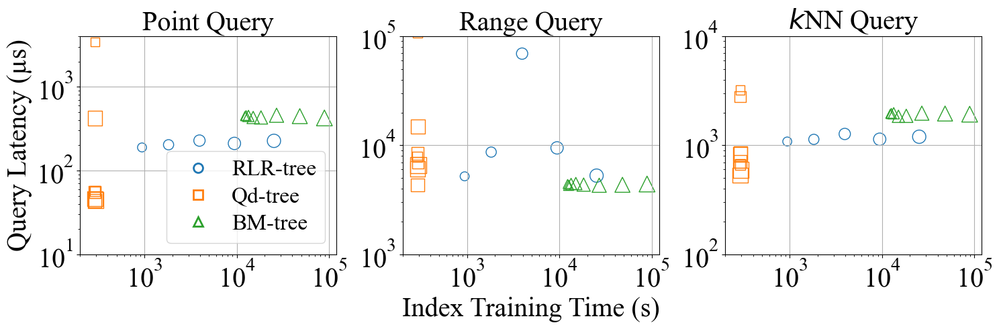

In [25]:
data_names = ["us_100000000"]
data_names_write = ["us_10000000"]
display_data_names = ["US"]
real_default_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_default_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
build_result_name_pattern = "{data_name}{default_range_name}{suffix}.txt"

data_name = "us_100000000"
query_ranges=[0.0001, 0.0005, 0.001, 0.005, 0.01]

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_{r1}x{r2}"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_{r1}x{r2}"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

baselines = ['rlrtree', 'qdtree',  'bmtree']
display_baselines = ['RLR-tree', 'Qd-tree', 'BM-tree']

baseline_suffixs = [{'bmtree':'_bits_32_depth_10_sample_10000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0001_action_space_200',
                   'rlrtree':'_rlrtree_epoch_10_sample_10000'},
                   {'bmtree':'_bits_32_depth_10_sample_20000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0002_action_space_200',
                   'rlrtree':'_rlrtree_epoch_10_sample_20000'},
                    {'bmtree':'_bits_32_depth_10_sample_40000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0004_action_space_200',
                   'rlrtree':'_rlrtree_epoch_10_sample_40000'},
                   {'bmtree':'_bits_32_depth_10_sample_80000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0008_action_space_200',
                   'rlrtree':'_rlrtree_epoch_10_sample_80000'},
                   {'bmtree':'_bits_32_depth_10_sample_160000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0016_action_space_200',
                   'rlrtree':'_rlrtree_epoch_10_sample_160000'},
                    {'bmtree':'_bits_32_depth_10_sample_320000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0032_action_space_200'},
                    {'bmtree':'_bits_32_depth_10_sample_640000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0064_action_space_200'},
                    {'bmtree':'_bits_32_depth_10_sample_1280000', 
                   'qdtree':'_episode_10_sampling_ratio_0.0128_action_space_200'}]

build_result_path = "../result/libspatialindex/HDD/4K/{name}/build/"
point_result_path = "../result/libspatialindex/HDD/4K/{name}/point/"
range_result_path = "../result/libspatialindex/HDD/4K/{name}/range/"
knn_result_path = "../result/libspatialindex/HDD/4K/{name}/knn/"

point_query = []
range_query = []
knn_query = []
build_time = []
for baseline in baselines:

    query_range = 0.001
    k=25
    point_query_sampled = []
    range_query_sampled = []
    knn_query_sampled = []
    build_time_sampled = []
    for baseline_suffix in baseline_suffixs:
        # print(baseline)
        if baseline not in baseline_suffix.keys():
            continue
        suffix = baseline_suffix[baseline]

        if data_name.startswith("data"):
            range_name = synthetic_range_name_pattern.format(r1=query_range,r2=query_range)
            point_name = synthetic_point_name.format(data_name=data_name)
            knn_name = synthetic_knn_name
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            range_name=real_range_name_pattern.format(data_name=data_name,r1=query_range,r2=query_range)
            point_name = real_point_name.format(data_name=data_name)
            knn_name = real_knn_name.format(data_name=data_name)
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''

        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name,
            suffix=suffix
        )

        # print(build_result_name)
        res = os.path.join(build_result_path.format(name=baseline), build_result_name)
        # print(res)
        tree_property = parse_rtree_properties(res)
        build_time_sampled.append(tree_property.ElapsedLearnTime / 1e9)
        
        # build_time_sampled.append((tree_property.ElapsedBuildTime + tree_property.ElapsedLearnTime) / 1e9)

        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        
        res = os.path.join(point_result_path.format(name=baseline), point_result_name)
        tree_property = parse_rtree_properties(res)
        # print(res)
        point_query_sampled.append(tree_property.QueryMean / 1e3)

        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        tree_property = parse_rtree_properties(res)
        range_query_sampled.append(tree_property.QueryMean / 1e3)

        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        tree_property = parse_rtree_properties(res)
        knn_query_sampled.append(tree_property.QueryMean / 1e3)

    # print(baseline)
    point_query.append(point_query_sampled)
    range_query.append(range_query_sampled)
    knn_query.append(knn_query_sampled)
    build_time.append(build_time_sampled)

# print(build_time)
# print(point_query)
# print(range_query)
# print(knn_query)

# display_sampled_size = ["$10^4$", "$5\\times10^4$", "$10^5$", "$5\\times10^5$", "$10^6$"]
display_sampled_size = ["$10^4$", "$2\\times10^4$", "$4\\times10^4$", "$8\\times10^4$", "$16\\times10^4$", "$32\\times10^4$", "$64\\times10^4$", "$128\\times10^4$"]
sampled_sizes = [1e4, 2 * 1e4, 4 * 1e4, 8 * 1e4, 16 * 1e4, 32 * 1e4, 64 * 1e4, 128 * 1e4]


fig, axes = plt.subplots(1, 3, figsize=(15, 5))  


plot_scatter(sampled_sizes, display_baselines, build_time, point_query, ax=axes[0], x_label="",y_label="Query Latency (µs)", title="Point Query", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/point_query_time_build_time.pdf", "../figs/exp_sigmod/point_query_time_build_time.png"], x_bottom=2*1e2, x_top=1.2*1e5, y_bottom=1e1, y_top=4*1e3, show_legend=True)

plot_scatter(sampled_sizes, display_baselines, build_time, range_query, ax=axes[1], x_label="Index Training Time (s)",y_label="", title="Range Query", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_time_build_time.pdf", "../figs/exp_sigmod/range_query_time_build_time.png"], x_bottom=2*1e2, x_top=1.2*1e5, y_bottom=1e3, y_top=1e5, show_legend=False)

plot_scatter(sampled_sizes, display_baselines, build_time, knn_query, ax=axes[2], x_label="",y_label="", title="$k$NN Query", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_time_build_time.pdf", "../figs/exp_sigmod/knn_query_time_build_time.png"], x_bottom=2*1e2, x_top=1.2*1e5, y_bottom=1e2, y_top=1e4, show_legend=False)



plt.tight_layout()

output_file_paths = [folder + "/exp_sigmod/all_query_time_build_time.pdf", "../figs/exp_sigmod/all_query_time_build_time.png"]
if output_file_paths:
    for output_file_path in output_file_paths:
        if output_file_path.endswith(".pdf"):
            plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
        if output_file_path.endswith(".png"):
            plt.savefig(output_file_path, format='png', bbox_inches='tight')

plt.show()


In [26]:
def plot_line_small(datasets, baseline_names, result, x_label="", y_label="", is_log=False, title="", output_file_paths=None, bottom=None, top=None, show_legend=False):
    label_size = 24
    legend_size = 20

    fig, ax = plt.subplots(figsize=(8, 4))
    
    
    # if show_legend:
    #     fig, ax = plt.subplots(figsize=(9, 4))
    # else:
    #     fig, ax = plt.subplots(figsize=(6, 4))
    x = np.arange(len(datasets))
    
    spacing = 0.02

    markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'x', '+']
    linestyles = ['-', '--', '-.']
    combinations = [(m, ls) for m in markers for ls in linestyles]
    for i, baseline in enumerate(baseline_names):
        offset = int(i / 3) * spacing
        adjusted_x = x + offset
        ax.plot(adjusted_x, result[i], label=baseline, marker=markers[i], linestyle=linestyles[i%len(linestyles)], color=colors[i % len(colors)], markersize=10)

    # colors = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#C2C2F0','#FFA07A', '#B0E0E6', '#FFD700', '#D3D3D3']

    if bottom:
        ax.set_ylim(bottom=bottom)
    if top:
        ax.set_ylim(top=top)
    ax.set_ylabel(y_label, fontsize=label_size + 2)
    ax.set_xlabel(x_label, fontsize=label_size + 2)
    ax.set_xticks(x + spacing * (len(baseline_names) // 3 - 1) / 2)
    ax.set_xticklabels(datasets, fontsize=label_size + 2)
    ax.tick_params(axis='x', labelsize=label_size + 2)
    ax.tick_params(axis='y', labelsize=label_size + 2)

    ax.set_title(title, fontsize=label_size + 2)
    
    if is_log:
        ax.set_yscale('log')
    
    # legend = ax.legend(loc='upper center', bbox_to_anchor=(1.1, 1), fontsize=legend_size, ncol=1)

    # if show_legend:
    #     legend = ax.legend(
    #         loc='upper center',
    #         bbox_to_anchor=(1.24, 1.05),
    #         fontsize=legend_size,
    #         ncol=1,
    #         borderaxespad=0.5,  # Border padding
    #         handletextpad=0.5,  # Padding between legend marker and text
    #         labelspacing=0.3    # Vertical space between legend entries
    #     )

    #     plt.setp(legend.get_title(), fontsize=legend_size)
    #     plt.tight_layout(rect=[0, 0, 0.97, 1])
        
    # else:
    #     plt.tight_layout()
    if show_legend:
        legend = ax.legend(
            loc='upper right',
            # bbox_to_anchor=(1.24, 1.05),
            fontsize=legend_size,
            ncol=3,
            borderaxespad=0.5,  # Border padding
            handletextpad=0.5,  # Padding between legend marker and text
            labelspacing=0.3,    # Vertical space between legend entries
            # frameon=False
        )
    
        plt.setp(legend.get_title(), fontsize=legend_size)

    plt.tight_layout()
    
    if output_file_paths:
        for output_file_path in output_file_paths:
            if output_file_path.endswith(".pdf"):
                plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
            if output_file_path.endswith(".png"):
                plt.savefig(output_file_path, format='png', bbox_inches='tight')
    
    plt.show()
    plt.close(fig)

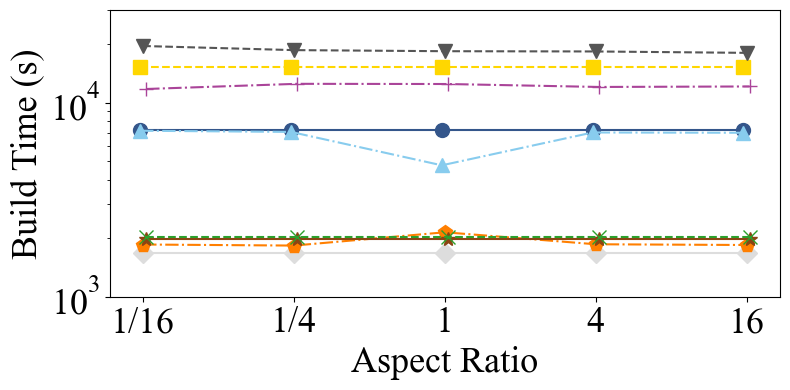

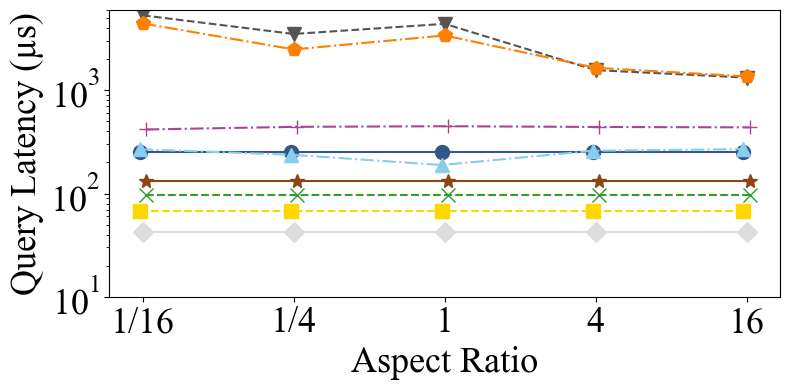

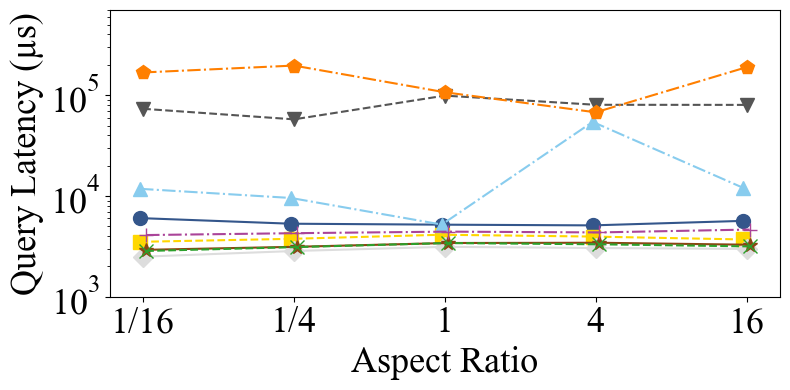

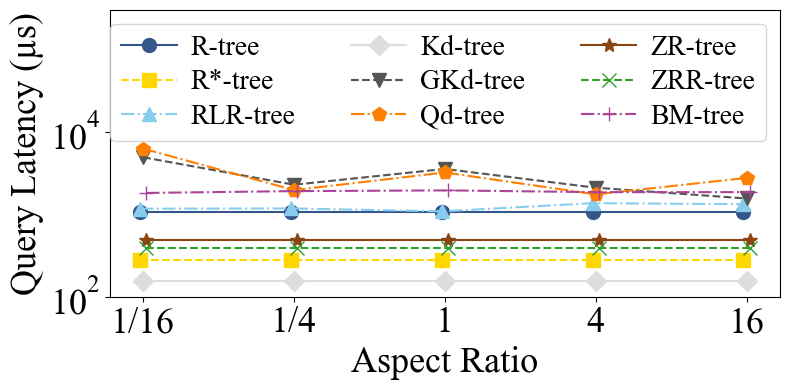

In [27]:
data_names = ["us_100000000"]
data_names_write = ["us_10000000"]
display_data_names = ["US"]
real_default_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_{r1}x{r2}"
synthetic_default_range_name_pattern = "_range_1000_2_uniform_1_{r1}x{r2}"
build_result_name_pattern = "{data_name}{default_range_name}{suffix}.txt"

data_name = "us_100000000"
query_ranges=[0.0001, 0.0005, 0.001, 0.005, 0.01]

query_range_r1 = [0.00025, 0.0005, 0.001, 0.002, 0.004]
query_range_r2 = [0.004, 0.002, 0.001, 0.0005, 0.00025]

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_{r1}x{r2}"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_{r1}x{r2}"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

# baselines = ['rlrtree', 'qdtree',  'bmtree']
# display_baselines = ['RLR-tree', 'Qd-tree','BM-tree']

# baseline_suffix = {'bmtree':'_bits_32_depth_10_sample_10000', 
#                    'qdtree':'_episode_10_sampling_ratio_0.0001_action_space_200',
#                    'rlrtree':'_rlrtree_epoch_10_sample_10000'}

baselines = ['rtree', 'r_star_tree', 'rlrtree', 'kdtree', 'kdtree_greedy', 'qdtree', 'zorder', 'rankspace_zorder', 'bmtree']
display_baselines = ['R-tree', 'R*-tree', 'RLR-tree', 'Kd-tree', 'GKd-tree', 'Qd-tree','ZR-tree', 'ZRR-tree', 'BM-tree']
baseline_suffix = {'bmtree':'_bits_32_depth_10_sample_10000', 
                   'kdtree':'',
                   'kdtree_greedy':'',
                   'qdtree':'_episode_10_sampling_ratio_0.0001_action_space_200',
                   'r_star_tree':'_rstar',
                   'rankspace_zorder':'_bits_32',
                   'rlrtree':'_rlrtree_epoch_10_sample_10000',
                   'rtree':'_quadratic',
                   'zorder':'_bits_32'}

point_query = []
range_query = []
knn_query = []
build_time = []

for baseline in baselines:

    k=25
    point_query_sampled = []
    range_query_sampled = []
    knn_query_sampled = []
    build_time_sampled = []
    for i in range(len(query_range_r1)):
        r1 = query_range_r1[i]
        r2 = query_range_r2[i]
        # print(baseline)
        suffix = baseline_suffix[baseline]
        if data_name.startswith("data"):
            range_name = synthetic_range_name_pattern.format(r1=r1,r2=r2)
            point_name = synthetic_point_name.format(data_name=data_name)
            knn_name = synthetic_knn_name
            default_range_name = synthetic_default_range_name_pattern.format(r1=r1,r2=r2) if baseline in special_baselines else ''
        else:
            range_name=real_range_name_pattern.format(data_name=data_name,r1=r1,r2=r2)
            point_name = real_point_name.format(data_name=data_name)
            knn_name = real_knn_name.format(data_name=data_name)
            default_range_name=real_default_range_name_pattern.format(data_name=data_name,r1=r1,r2=r2) if baseline in special_baselines else ''

        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name,
            suffix=suffix
        )

        # print(build_result_name)
        res = os.path.join(build_result_path.format(name=baseline), build_result_name)
        tree_property = parse_rtree_properties(res)
        # build_time_sampled.append(tree_property.ElapsedLearnTime / 1e9)
        build_time_sampled.append(tree_property.ElapsedTime / 1e9)
        
        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name,
            suffix=suffix
        )
        # print(point_result_name)
        
        res = os.path.join(point_result_path.format(name=baseline), point_result_name)
        tree_property = parse_rtree_properties(res)
        point_query_sampled.append(tree_property.QueryMean / 1e3)

        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        # print(range_result_name)

        res = os.path.join(range_result_path.format(name=baseline), range_result_name)
        tree_property = parse_rtree_properties(res)
        range_query_sampled.append(tree_property.QueryMean / 1e3)

        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline), knn_result_name)
        tree_property = parse_rtree_properties(res)
        knn_query_sampled.append(tree_property.QueryMean / 1e3)

    # print(baseline)
    point_query.append(point_query_sampled)
    range_query.append(range_query_sampled)
    knn_query.append(knn_query_sampled)
    build_time.append(build_time_sampled)

# print(point_query)
# print(range_query)
# print(knn_query)

display_aspect_ratio = ["1/16", "1/4", "1", "4", "16"]

# plot_line(display_aspect_ratio, display_baselines, build_time, x_label="Aspect Ratio", y_label="Build Time (s)", is_log=True, output_file_paths=
#           [folder + "/figs/build_time_varying_aspect_ratio.pdf", "../figs/exp/build_time_varying_aspect_ratio.png"], bottom=1e3, top=1e5)

# plot_line(display_aspect_ratio, display_baselines, point_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/point_query_time_varying_aspect_ratio.pdf", "../figs/exp/point_query_time_varying_aspect_ratio.png"], bottom=1e1, top=2*1e4)

# plot_line(display_aspect_ratio, display_baselines, range_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/range_query_time_varying_aspect_ratio.pdf", "../figs/exp/range_query_time_varying_aspect_ratio.png"], bottom=1e3, top=2*1e6)

# plot_line(display_aspect_ratio, display_baselines, knn_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
#           [folder + "/figs/knn_query_time_varying_aspect_ratio.pdf", "../figs/exp/knn_query_time_varying_aspect_ratio.png"], bottom=1e2, top=4*1e4, show_legend=True)

plot_line_small(display_aspect_ratio, display_baselines, build_time, x_label="Aspect Ratio", y_label="Build Time (s)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/build_time_varying_aspect_ratio_line.pdf", "../figs/exp_sigmod/build_time_varying_aspect_ratio_line.png"], bottom=1e3, top=3*1e4)

plot_line_small(display_aspect_ratio, display_baselines, point_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/point_query_time_varying_aspect_ratio_line.pdf", "../figs/exp_sigmod/point_query_time_varying_aspect_ratio_line.png"], bottom=1e1, top=6*1e3)

plot_line_small(display_aspect_ratio, display_baselines, range_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/range_query_time_varying_aspect_ratio_line.pdf", "../figs/exp_sigmod/range_query_time_varying_aspect_ratio_line.png"], bottom=1e3, top=7*1e5)

plot_line_small(display_aspect_ratio, display_baselines, knn_query, x_label="Aspect Ratio", y_label="Query Latency (µs)", is_log=True, output_file_paths=
          [folder + "/exp_sigmod/knn_query_time_varying_aspect_ratio_line.pdf", "../figs/exp_sigmod/knn_query_time_varying_aspect_ratio_line.png"], bottom=1e2, top=3*1e5, show_legend=True)


In [28]:
disk_types = ["HDD", "SSD"]

query_types = ["Index Building", "Point Query", "Range Query", "$k$NN Query"]

build_result_path = "../result/libspatialindex/{disk_type}/4K/{name}/build/"
point_result_path = "../result/libspatialindex/{disk_type}/4K/{name}/point/"
range_result_path = "../result/libspatialindex/{disk_type}/4K/{name}/range/"
knn_result_path = "../result/libspatialindex/{disk_type}/4K/{name}/knn/"

baseline_suffix = {'bmtree':'_bits_32_depth_10_sample_10000', 
                   'kdtree':'',
                   'kdtree_greedy':'',
                   'qdtree':'_episode_10_sampling_ratio_0.0001_action_space_200',
                   'r_star_tree':'_rstar',
                   'rankspace_zorder':'_bits_32',
                   'rlrtree':'_rlrtree_epoch_10_sample_10000',
                   'rtree':'_quadratic',
                   'zorder':'_bits_32'}

data_names = ["us_100000000"]
display_data_names = ["US"]
real_default_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_default_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
build_result_name_pattern = "{data_name}{default_range_name}{suffix}.txt"
special_baselines = ['bmtree', 'kdtree_greedy', 'rlrtree', 'qdtree']
baselines = ['rtree', 'r_star_tree', 'rlrtree', 'kdtree', 'kdtree_greedy', 'qdtree', 'zorder', 'rankspace_zorder', 'bmtree']
display_baselines = ['R-tree', 'R*-tree', 'RLR-tree', 'Kd-tree', 'GKd-tree', 'Qd-tree','ZR-tree', 'ZRR-tree', 'BM-tree']

real_range_name_pattern = "_{data_name}_range_1000_2_uniform_1_0.001x0.001"
synthetic_range_name_pattern = "_range_1000_2_uniform_1_0.001x0.001"
range_result_name_pattern = "{data_name}{range_name}{suffix}.txt"

In [29]:
data_name = "us_100000000"
k=25
point_query = []
range_query = []
knn_query = []
build_time = []

for baseline in baselines:
    point_query_sampled = []
    range_query_sampled = []
    knn_query_sampled = []
    build_time_sampled = []
    for disk_type in disk_types:    

        suffix = baseline_suffix[baseline]

        if data_name.startswith("data"):
            default_range_name = synthetic_default_range_name_pattern if baseline in special_baselines else ''
        else:
            default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
            


        # default_range_name=real_default_range_name_pattern.format(data_name=data_name) if baseline in special_baselines else ''
        range_name=real_range_name_pattern.format(data_name=data_name)
        build_result_name = build_result_name_pattern.format(
            data_name=data_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix
        )

        # print(build_result_name)
        res = os.path.join(build_result_path.format(name=baseline,disk_type=disk_type), build_result_name)
        tree_property = parse_rtree_properties(res)
        # build_time_sampled.append(tree_property.ElapsedLearnTime / 1e9)
        build_time_sampled.append(tree_property.ElapsedTime / 1e9)
        
        point_result_name = point_result_name_pattern.format(
            data_name=data_name,
            point_name=point_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix
        )
        # print(point_result_name)
        
        res = os.path.join(point_result_path.format(name=baseline,disk_type=disk_type), point_result_name)
        tree_property = parse_rtree_properties(res)
        point_query_sampled.append(tree_property.QueryMean / 1e3)

        range_result_name = range_result_name_pattern.format(
            data_name=data_name,
            range_name=range_name,
            suffix=suffix
        )
        # print(range_result_name)

        res = os.path.join(range_result_path.format(name=baseline,disk_type=disk_type), range_result_name)
        tree_property = parse_rtree_properties(res)
        range_query_sampled.append(tree_property.QueryMean / 1e3)

        knn_result_name = knn_result_name_pattern.format(
            data_name=data_name,
            knn_name=knn_name,
            default_range_name=default_range_name.format(data_name=data_name) if baseline in special_baselines else '',
            suffix=suffix,
            k=k
        )
        res = os.path.join(knn_result_path.format(name=baseline,disk_type=disk_type), knn_result_name)
        tree_property = parse_rtree_properties(res)
        knn_query_sampled.append(tree_property.QueryMean / 1e3)

        # print(build_result_path.format(name=baseline,disk_type=disk_type), build_result_name)
        # print(point_result_path.format(name=baseline,disk_type=disk_type),point_result_name)
        # print(range_result_path.format(name=baseline,disk_type=disk_type), range_result_name)
        # print(knn_result_path.format(name=baseline,disk_type=disk_type), knn_result_name)
    #     break
    # break

    point_query.append(point_query_sampled)
    range_query.append(range_query_sampled)
    knn_query.append(knn_query_sampled)
    build_time.append(build_time_sampled)
    


# print(point_query)
# print(range_query)
# print(knn_query)
# print(build_time)

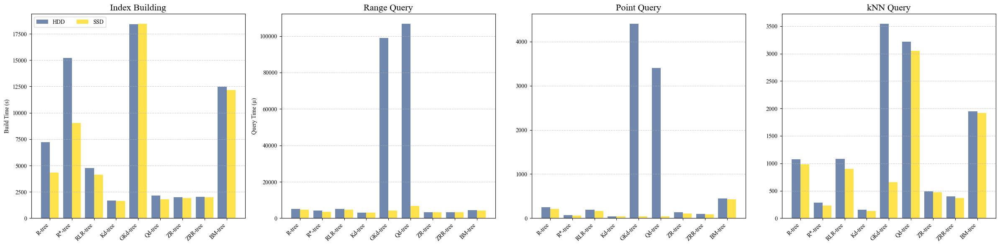

In [30]:
import matplotlib.pyplot as plt
import numpy as np


# 确保所有数据都是普通的 Python 列表
all_data = [build_time, range_query, point_query, knn_query]
query_types = ['Index Building', 'Range Query', 'Point Query', 'kNN Query']

# 显示的基线标签
# display_baselines = [f'Baseline {i+1}' for i in range(9)]  # 9 个基线

# 设置柱状图的位置和宽度
group_width = 0.8  # 每组的宽度
individual_bar_width = group_width / 2  # 每个柱状图的宽度（HDD 和 SSD 各占一半）
offset = individual_bar_width / 2  # 用来让 HDD 和 SSD 柱状图并排显示的偏移量

# 创建四个子图，水平排列
fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharey=False)

# 遍历每个查询类型和构建时间，为每个子图绘制数据
for i, (ax, query_type, data) in enumerate(zip(axes, query_types, all_data)):
    x = np.arange(len(display_baselines))  # 设置9个基线的位置
    
    # 使用列表推导式提取数据
    hdd_values = [row[0] for row in data]  # 提取 HDD 数据
    ssd_values = [row[1] for row in data]  # 提取 SSD 数据
    
    # 绘制 HDD 和 SSD 的柱状图
    ax.bar(x - offset, hdd_values, individual_bar_width, label='HDD', color=colors[0], alpha=0.7)  # HDD 值
    ax.bar(x + offset, ssd_values, individual_bar_width, label='SSD', color=colors[1], alpha=0.7)  # SSD 值

    # 设置子图标签和标题
    ax.set_title(f'{query_type}', fontsize=16)
    ax.set_xticks(x)  # 设置 X 轴刻度
    ax.set_xticklabels(display_baselines, rotation=45, ha='right')  # 基线名称

    if i == 1:
        ax.set_ylabel('Query Time (µ)')  # 只有第一个子图显示查询时间的 Y 轴标签
    elif i == 0:
        ax.set_ylabel('Build Time (s)')  # 最后一个子图显示构建时间的 Y 轴标签
    
    # 添加网格
    ax.grid(True, axis='y', linestyle='--', alpha=0.6)

# 添加图例，只需在第一个子图中展示图例
axes[0].legend(loc='upper left',ncol=2)

# 调整布局
plt.tight_layout()

# 显示图像
plt.show()

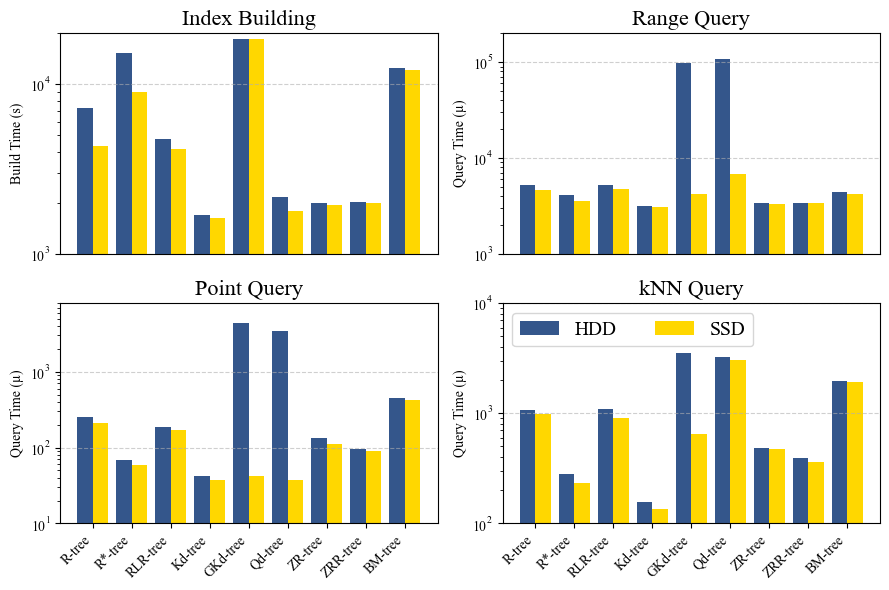

In [58]:
import matplotlib.pyplot as plt
import numpy as np

# 确保所有数据都是普通的 Python 列表
all_data = [build_time, range_query, point_query, knn_query]
query_types = ['Index Building', 'Range Query', 'Point Query', 'kNN Query']
bottoms = [1e3, 1*1e3, 1e1, 1e2]
tops = [2*1e4, 2*1e5, 8*1e3, 1e4]

# 显示的基线标签
# display_baselines = [f'Baseline {i+1}' for i in range(9)]  # 9 个基线

# 设置柱状图的位置和宽度
group_width = 0.8  # 每组的宽度
individual_bar_width = group_width / 2  # 每个柱状图的宽度（HDD 和 SSD 各占一半）
offset = individual_bar_width / 2  # 用来让 HDD 和 SSD 柱状图并排显示的偏移量

# 创建 2 行 2 列的子图，水平排列
fig, axes = plt.subplots(2, 2, figsize=(9, 6), sharey=False)

# 遍历每个查询类型和构建时间，为每个子图绘制数据
for i, (ax, query_type, data) in enumerate(zip(axes.flat, query_types, all_data)):
    x = np.arange(len(display_baselines))  # 设置9个基线的位置
    
    # 使用列表推导式提取数据
    hdd_values = [row[0] for row in data]  # 提取 HDD 数据
    ssd_values = [row[1] for row in data]  # 提取 SSD 数据
    
    # 绘制 HDD 和 SSD 的柱状图
    ax.bar(x - offset, hdd_values, individual_bar_width, label='HDD', color=colors[0], alpha=1.0)  # HDD 值
    ax.bar(x + offset, ssd_values, individual_bar_width, label='SSD', color=colors[1], alpha=1.0)  # SSD 值

    # 设置子图标签和标题
    ax.set_title(f'{query_type}', fontsize=16)
    if i > 1:
        ax.set_xticks(x)  # 设置 X 轴刻度
        ax.set_xticklabels(display_baselines, rotation=45, ha='right')  # 基线名称
    else:
        ax.set_xticks([])  # 设置 X 轴刻度
        

    if i == 0:
        ax.set_ylabel('Build Time (s)')  # 第一个子图显示构建时间的 Y 轴标签
    else:
        ax.set_ylabel('Query Time (µ)')  # 第二个子图显示查询时间的 Y 轴标签

    ax.set_ylim(bottom=bottoms[i])
    ax.set_ylim(top=tops[i])
    
    ax.set_yscale('log')
    # 添加网格
    ax.grid(True, axis='y', linestyle='--', alpha=0.6)

# 调整图例字体大小并只需在第一个子图中展示图例
axes[1, 1].legend(loc='upper left', fontsize=14, ncol=2)  # 调大字体大小

output_file_paths = [folder + "/exp_sigmod/hdd_vs_ssd.pdf", "../figs/exp_sigmod/hdd_vs_ssd.png"]

plt.tight_layout()

if output_file_paths:
    for output_file_path in output_file_paths:
        if output_file_path.endswith(".pdf"):
            plt.savefig(output_file_path, format='pdf', bbox_inches='tight')
        if output_file_path.endswith(".png"):
            plt.savefig(output_file_path, format='png', bbox_inches='tight')


plt.show()